# **PSX-Tick Forecast Challenge**

### Predicting Pakistan Stock Exchange Movement at Tick Level

## 📖 Background

The data has been collected from Pakistan Stock Exchange almost regularly from January to October 2023. There is one ID column, 6 input columns, and one output column labeled as "Price" in this dataset.


## 💾 The Data

The data for this competition is stored in table, `train.csv` and `test.csv`.

### `train.csv` and `test.csv`

##### **Input Variables**

This table contains aggregated data for each PSx Stock:

- **ID** - The identity of each record in a sequence. This must not be modified because the identity column helps in the evaluation of the results submitted by participants.
- **Scrip** - The name or code of a company registered in PSX
- **Datetime** - The date and time at which the transaction was performed i.e., the shares were purchased/sold
- **Date** - The date at which the transaction was performed i.e., the shares were purchased/sold
- **Volume** - It refers to the total number of shares or contracts traded
- **OpenDaily** - It refers to the price at which a share or security first trades upon the opening of the market for a particular trading session
- **LDCP** - It stands for "Last Day Closing Price." This term refers to the closing price of a share or security on the most recent trading day

##### **Output Variables**

- **Price** - It refers to the current market value of a stock or security, which is determined by the most recent transaction between a buyer and a seller.


## Import Libraries


In [147]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from scipy import stats
from prophet import Prophet
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.seasonal import STL

import warnings
warnings.filterwarnings('ignore')

## Loading the Datasets


In [200]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

## Getting Insights about the Data


In [201]:
train.head()

,ID,Scrip,Datetime,Price,Volume,Date,Open_daily,LDCP
0,2429,ABOT,2023-01-02 18:00:00,460.53,7500,2023-01-02,456.14,463.31
1,2430,ABOT,2023-01-03 18:00:00,450.20,10400,2023-01-03,455.00,460.53
2,2431,ABOT,2023-01-04 18:00:00,450.00,3350,2023-01-04,450.00,450.20
3,2432,ABOT,2023-01-05 18:00:00,444.69,11200,2023-01-05,445.00,450.00
4,2433,ABOT,2023-01-06 18:00:00,438.00,8900,2023-01-06,444.00,444.69


In [202]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57058 entries, 0 to 57057
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          57058 non-null  int64  
 1   Scrip       57058 non-null  object 
 2   Datetime    57058 non-null  object 
 3   Price       57058 non-null  float64
 4   Volume      57058 non-null  int64  
 5   Date        57058 non-null  object 
 6   Open_daily  57058 non-null  float64
 7   LDCP        57058 non-null  float64
dtypes: float64(3), int64(2), object(3)
memory usage: 3.5+ MB


- The dataset contain 57058 rows from index range 0 to 57057.
- The columns don't contain any type of null values
- There are total 8 columns (7 independant and 1 dependant column)
- The Data and Datetime columns don't have correct Dtypes
- 3 columns are float, 2 int, 1 object or string and 2 with wrong data types


In [203]:
train.describe()

,ID,Price,Volume,Open_daily,LDCP
count,57058.000000,57058.000000,5.705800e+04,57058.000000,57058.000000
mean,40266.999387,45.930993,6.175232e+03,45.716802,45.639029
std,22107.290972,76.174140,4.833934e+04,75.855968,76.000625
min,2429.000000,4.010000,-1.150000e+04,0.000000,4.140000
25%,21510.250000,7.850000,5.000000e+02,8.140000,7.920000
50%,40846.500000,11.600000,1.000000e+03,11.680000,11.650000
75%,60606.750000,58.617500,4.000000e+03,58.270000,58.550000
max,79699.000000,460.530000,8.302513e+06,456.140000,463.310000


## Correcting Data Types of Data and Datetime columns


In [204]:
train['Date'] = pd.to_datetime(train['Date'])
train['Datetime'] = pd.to_datetime(train['Datetime'])

In [205]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57058 entries, 0 to 57057
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   ID          57058 non-null  int64         
 1   Scrip       57058 non-null  object        
 2   Datetime    57058 non-null  datetime64[ns]
 3   Price       57058 non-null  float64       
 4   Volume      57058 non-null  int64         
 5   Date        57058 non-null  datetime64[ns]
 6   Open_daily  57058 non-null  float64       
 7   LDCP        57058 non-null  float64       
dtypes: datetime64[ns](2), float64(3), int64(2), object(1)
memory usage: 3.5+ MB


Now all the columns have the correct data types


#### Extracting usefull informtation form Date columns


In [206]:
train['Year'] = train['Date'].dt.year
train['Month'] = train['Date'].dt.month
train['Day'] = train['Date'].dt.day

In [207]:
train['DayOfWeek'] = train['Datetime'].dt.dayofweek
train['Hour'] = train['Datetime'].dt.hour

In [208]:
train['Year from Datetime'] = train['Datetime'].dt.year
train['Month from Datetime'] = train['Datetime'].dt.month
train['Day from Datetime'] = train['Datetime'].dt.day

In [209]:
#checking that Date and Datetime are the same
print(train['Year'].equals(train['Year from Datetime']))
print(train['Month'].equals(train['Month from Datetime']))
print(train['Day'].equals(train['Day from Datetime']))

True
True
True


In [210]:
#Since the Date and Datetime columns are the same, we can drop the Date column.
train.drop(['Year from Datetime', 'Month from Datetime', 'Day from Datetime', 'Date'], axis=1, inplace=True)

In [211]:
train.tail()

,ID,Scrip,Datetime,Price,Volume,Open_daily,LDCP,Year,Month,Day,DayOfWeek,Hour
57053,79695,AICL,2023-08-15 15:06:46,32.00,500,31.5,31.9,2023,8,15,1,15
57054,79696,AICL,2023-08-15 15:06:49,32.99,50000,31.5,31.9,2023,8,15,1,15
57055,79697,AICL,2023-08-15 15:07:39,32.00,3000,31.5,31.9,2023,8,15,1,15
57056,79698,AICL,2023-08-15 15:11:32,31.60,2000,31.5,31.9,2023,8,15,1,15
57057,79699,AICL,2023-08-15 15:18:07,31.90,500,31.5,31.9,2023,8,15,1,15


In [212]:
train.isnull().sum()

ID            0
Scrip         0
Datetime      0
Price         0
Volume        0
Open_daily    0
LDCP          0
Year          0
Month         0
Day           0
DayOfWeek     0
Hour          0
dtype: int64

## Exploratory Data Analysis


In [213]:
stocks = train['Scrip'].unique()
stocks = list(stocks)
len(stocks)

10

Hence we have the data of 10 stocks


In [214]:
plt.style.use('ggplot')

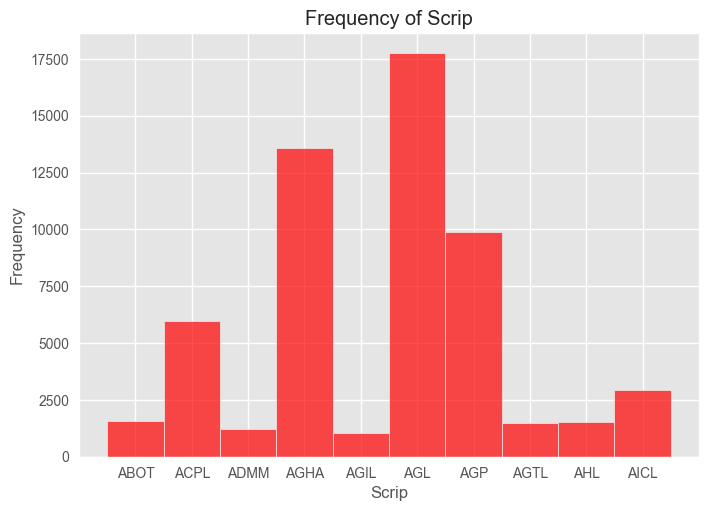

In [163]:
sns.histplot(train['Scrip'], bins='auto', kde=False, color='red', alpha=0.7, binwidth=1)
plt.xlabel('Scrip')
plt.ylabel('Frequency')
plt.title('Frequency of Scrip')
plt.show()

#### Identifying Trend and Seasonality


In [164]:
from numpy import polyfit

def fit(X, y, degree=3):
    coef = polyfit(X, y, degree)
    trendpoly = np.poly1d(coef)
    return trendpoly(X)

def get_season(s, yearly_periods=4, degree=3): 
    X = [i%(365/4) for i in range(0, len(s))] 
    seasonal = fit(X, s.values, degree) 
    return pd.Series(data=seasonal, index=s.index)

def get_trend(s, degree=3): 
    X = list(range(len(s))) 
    trend = fit(X, s.values, degree) 
    return pd.Series(data=trend, index=s.index)

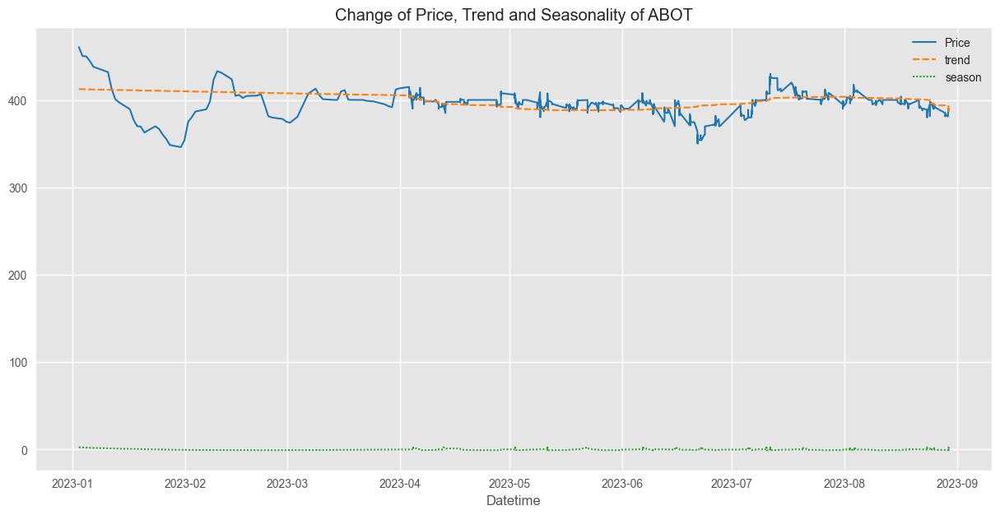

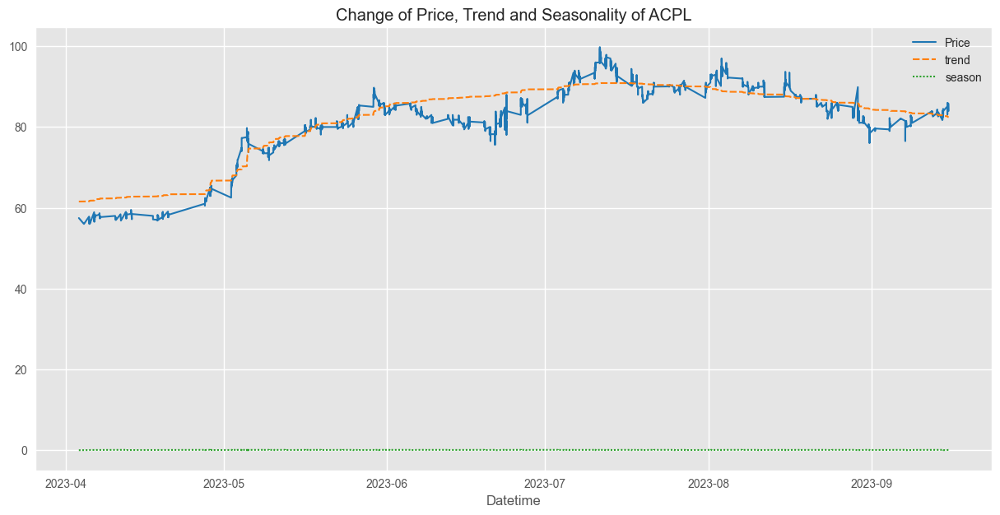

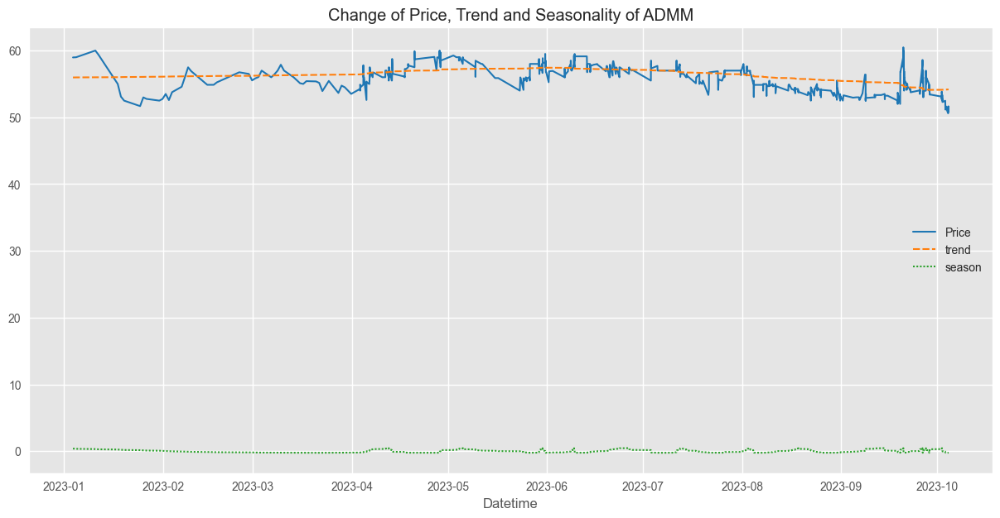

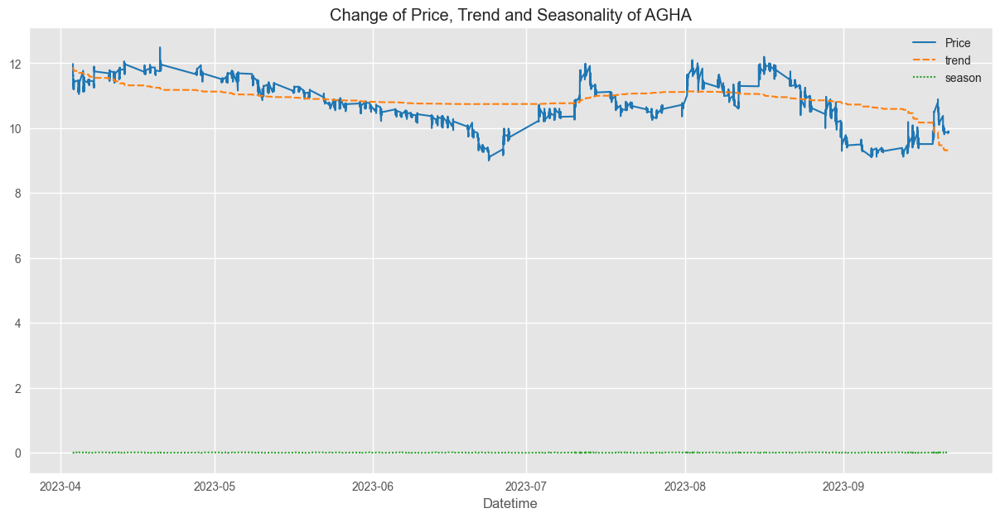

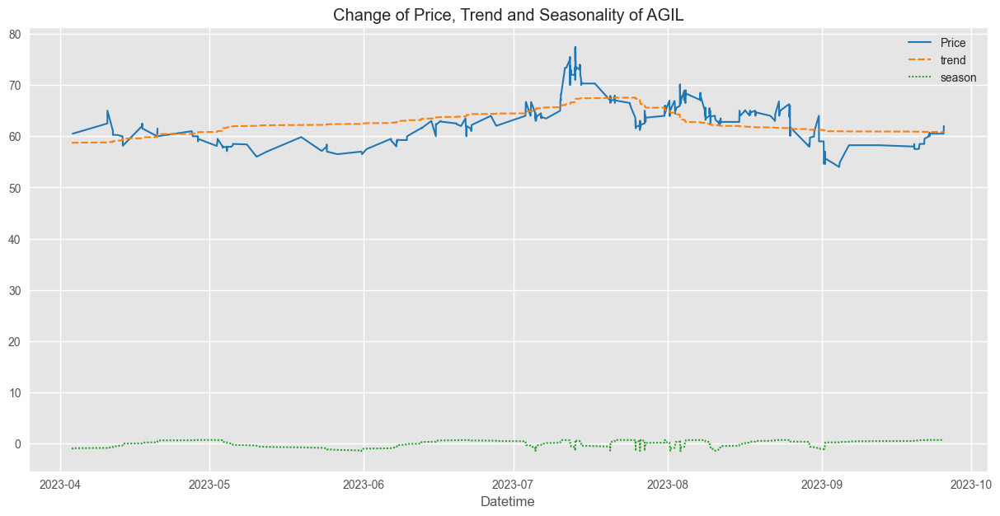

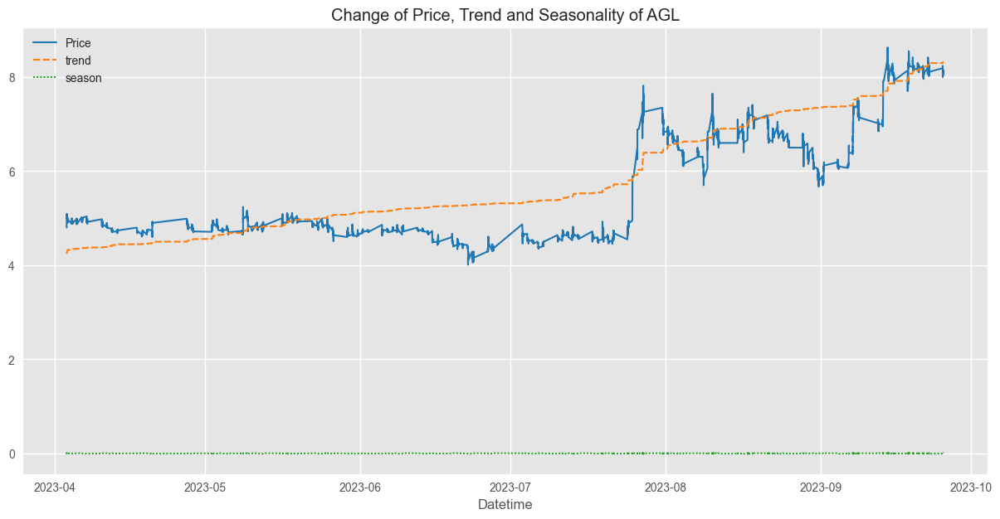

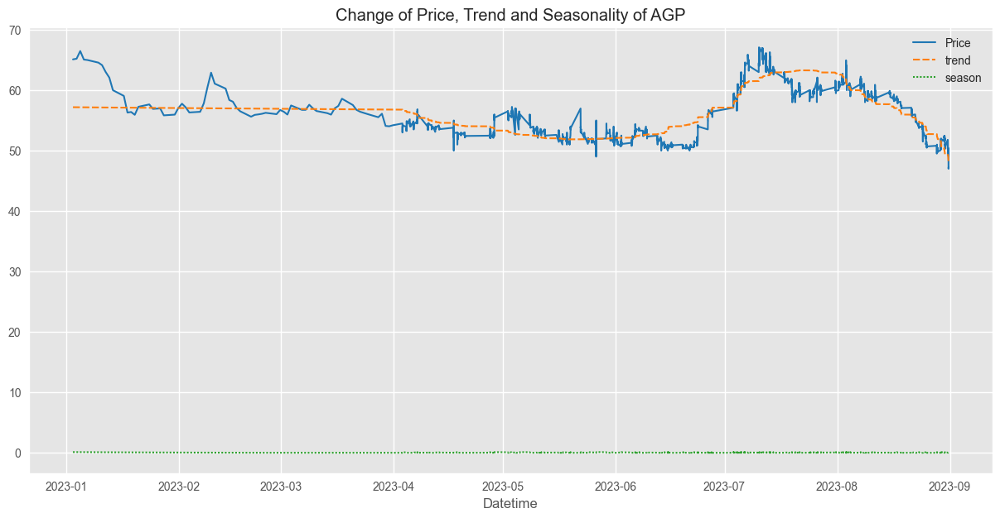

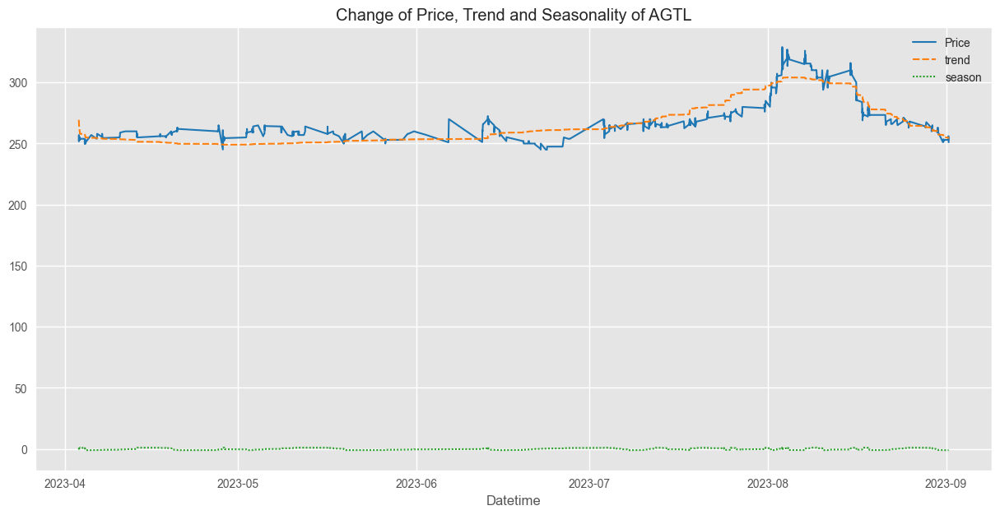

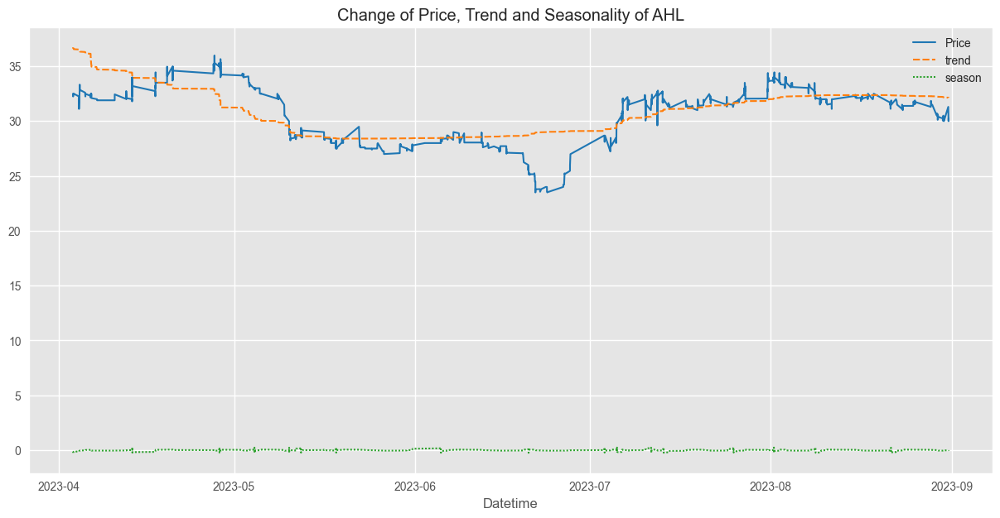

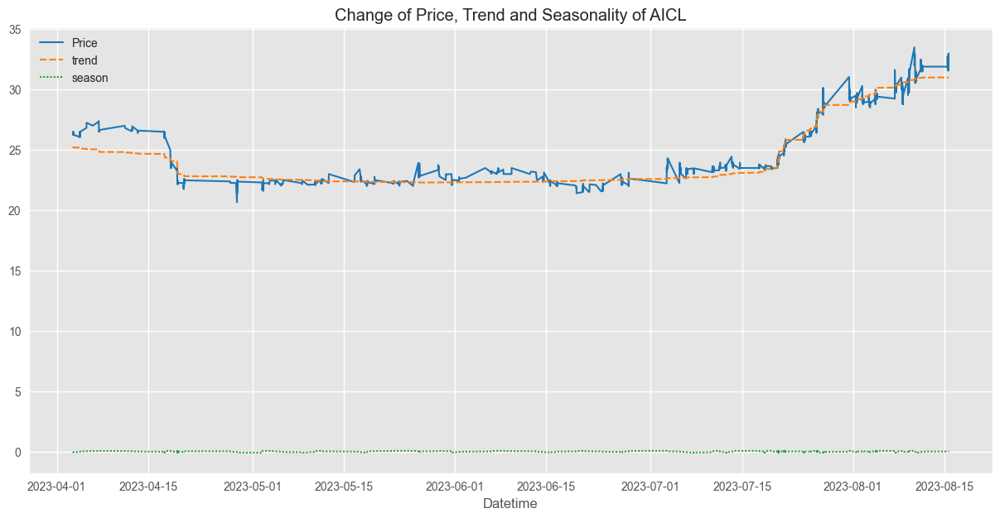

In [165]:
for i in stocks:
    plt.figure(figsize=(15, 7))
    stock = train[train['Scrip'] == i].set_index('Datetime')
    stock['trend'] = get_trend(stock['Price'])
    stock['season'] = get_season(stock['Price']-stock['trend'])
    
    sns.lineplot(data=stock[['Price', 'trend', 'season']], palette='tab10', linewidth=1.5)
    plt.title(f'Change of Price, Trend and Seasonality of {i}')
    plt.show()


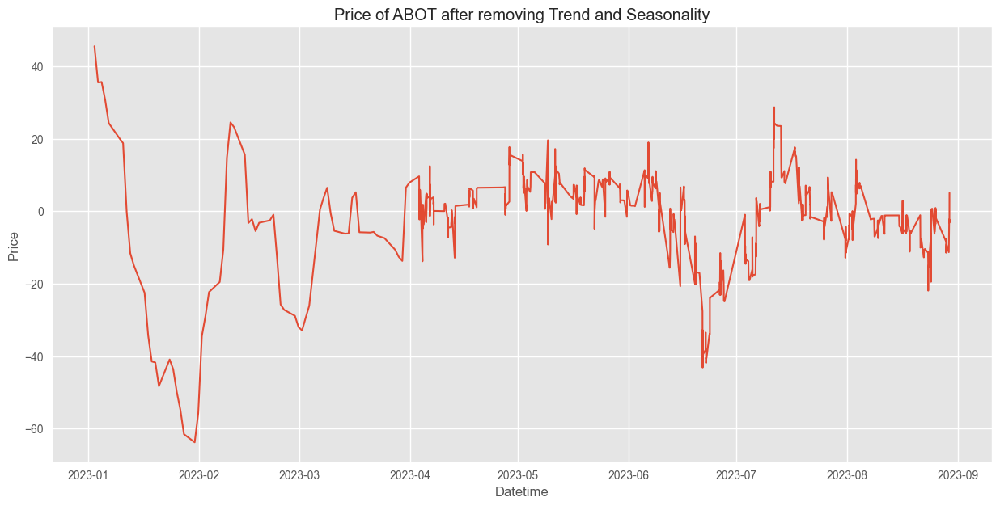

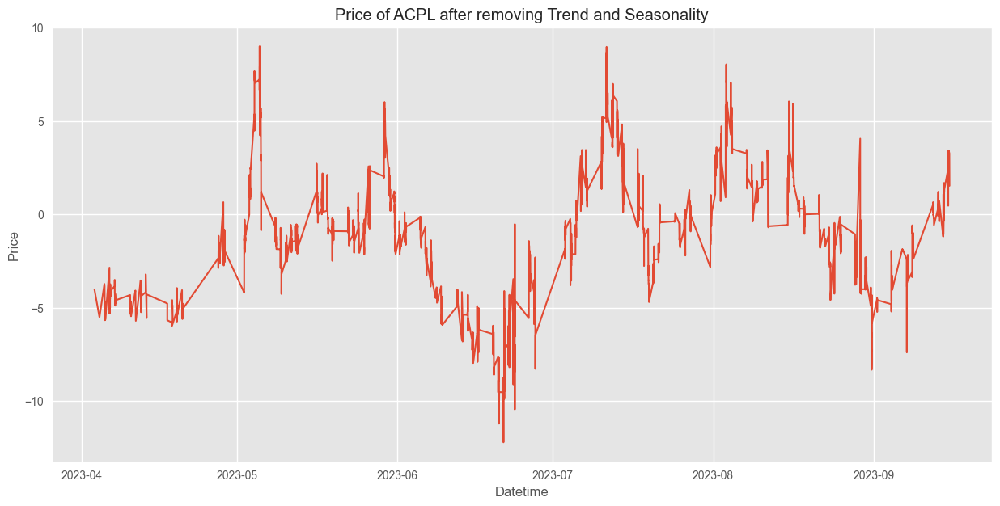

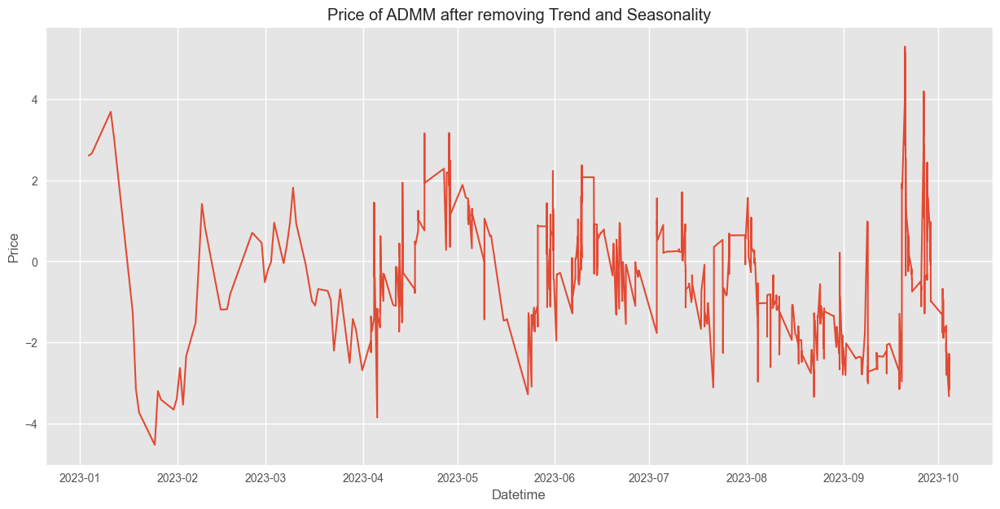

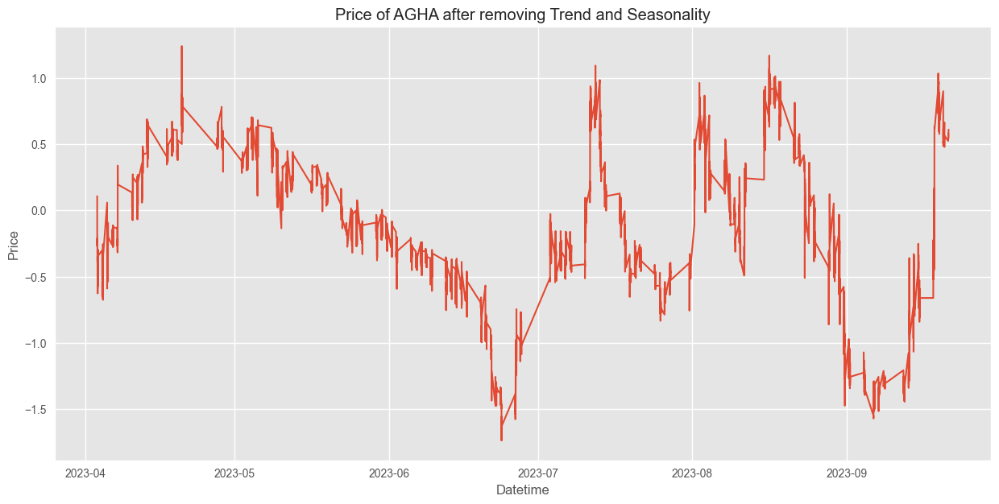

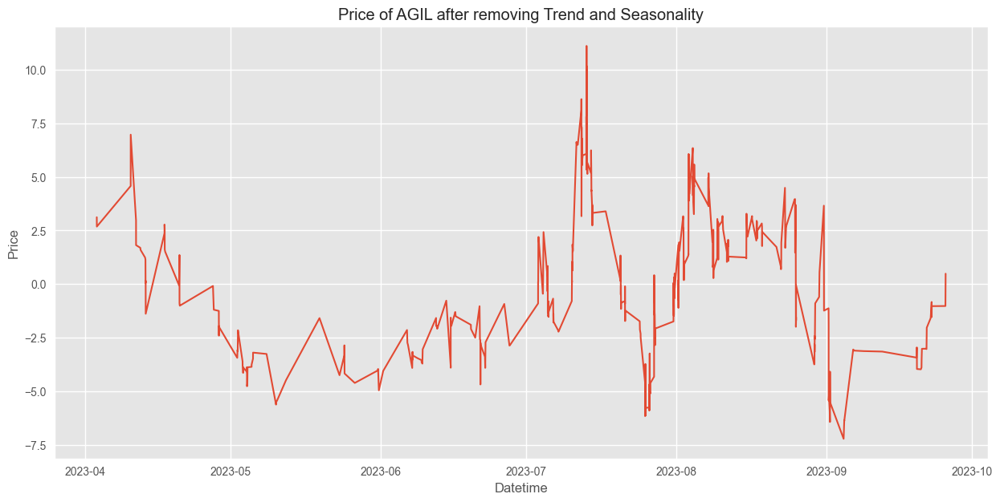

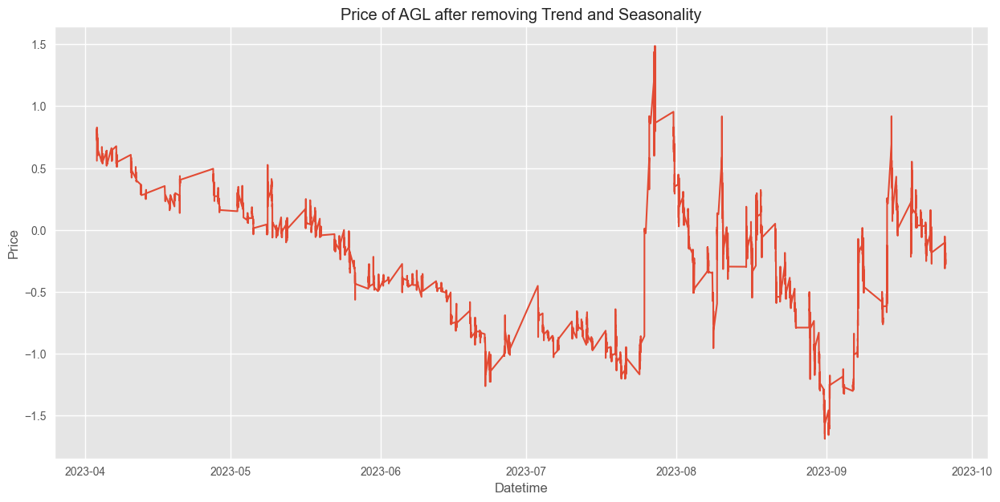

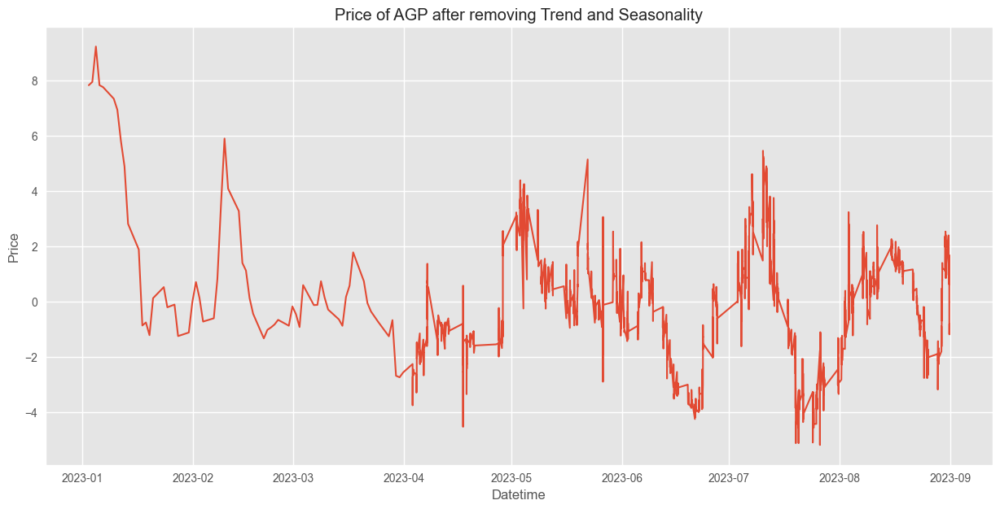

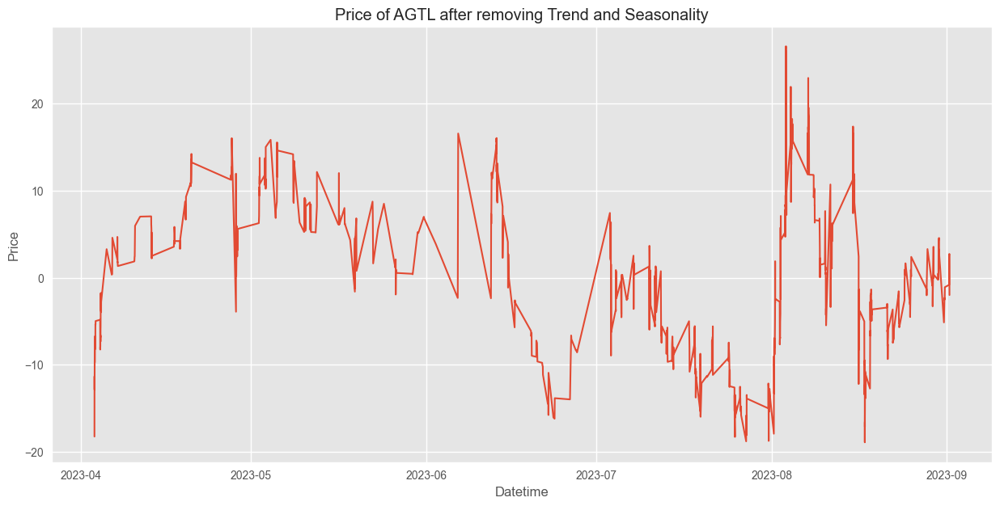

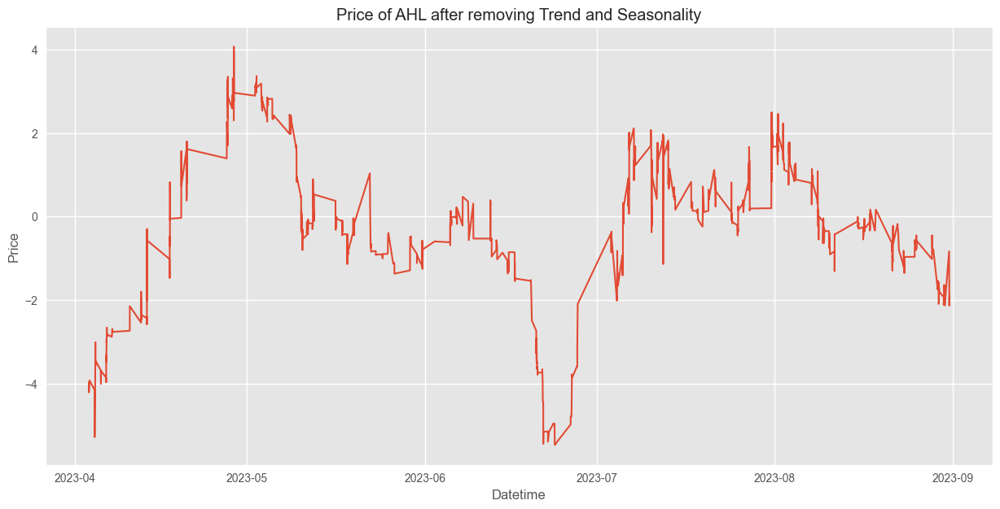

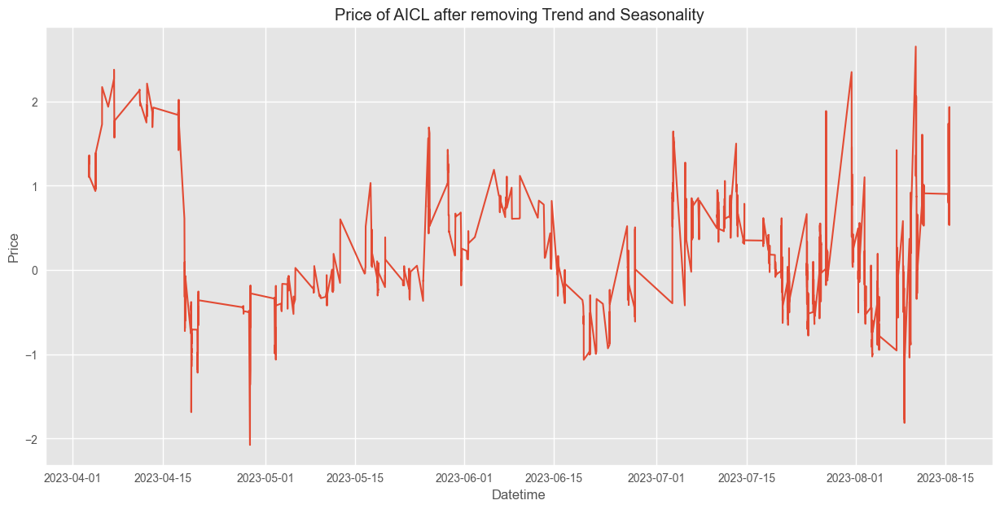

In [166]:
for i in stocks:
    plt.figure(figsize=(15, 7))
    stock = train[train['Scrip'] == i].set_index('Datetime')
    stock['Price'] = stock['Price'] - get_trend(stock['Price'])
    stock['Price'] = stock['Price'] - get_season(stock['Price'])
    
    sns.lineplot(data=stock['Price'], palette='tab10', linewidth=1.5)
    plt.title(f'Price of {i} after removing Trend and Seasonality')
    plt.show()

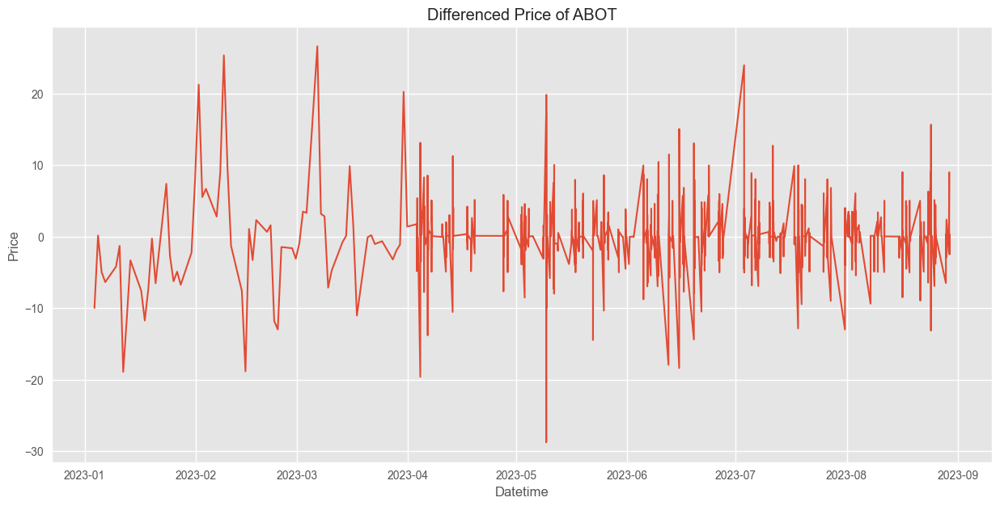

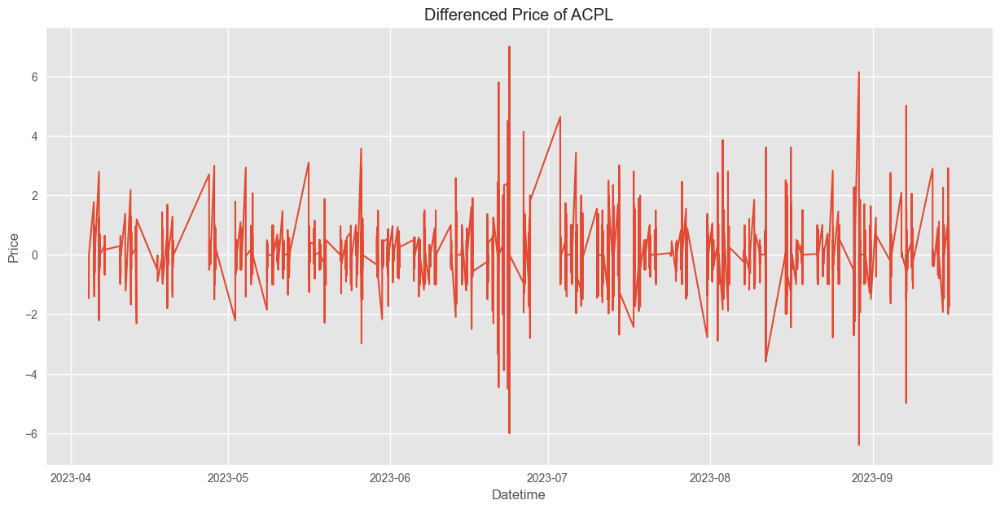

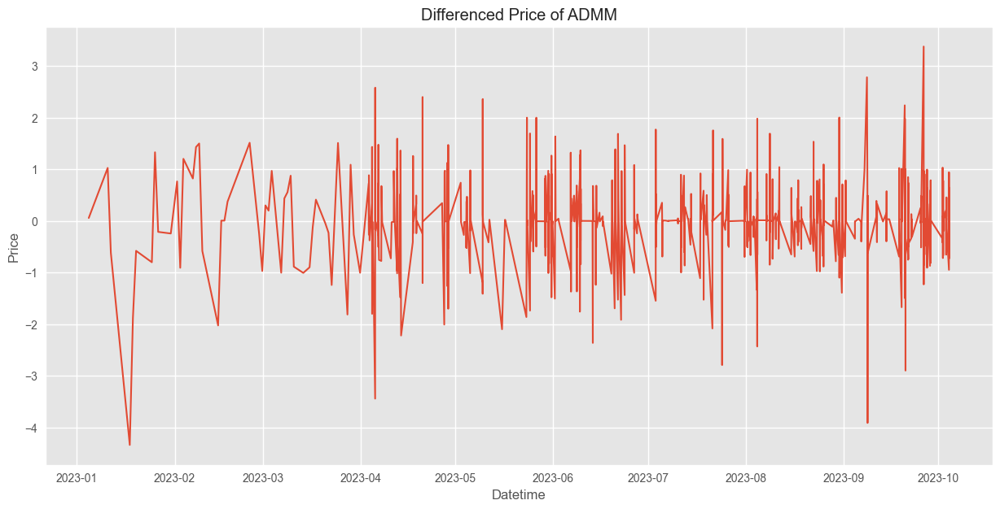

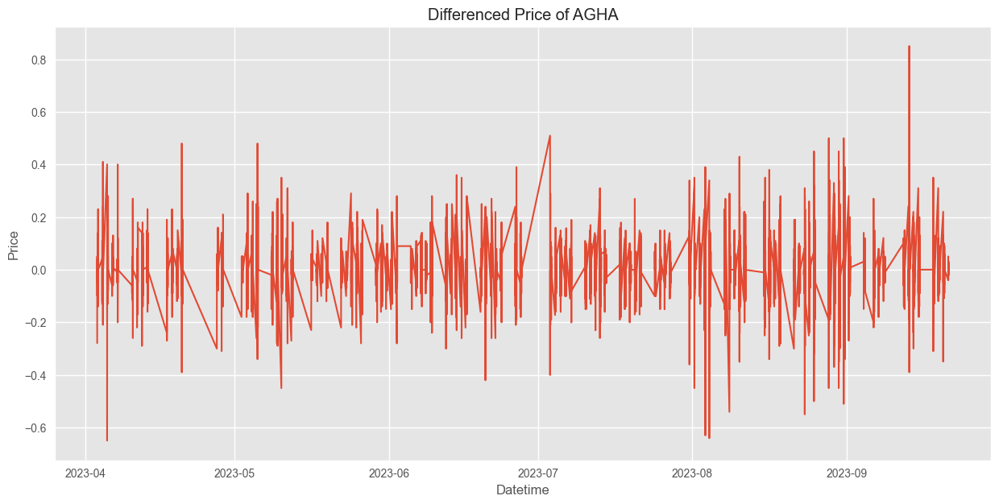

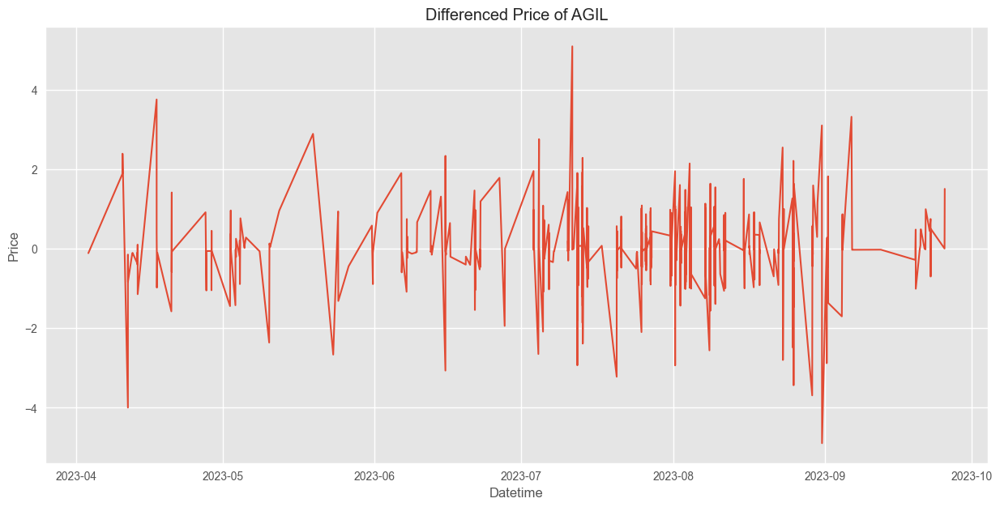

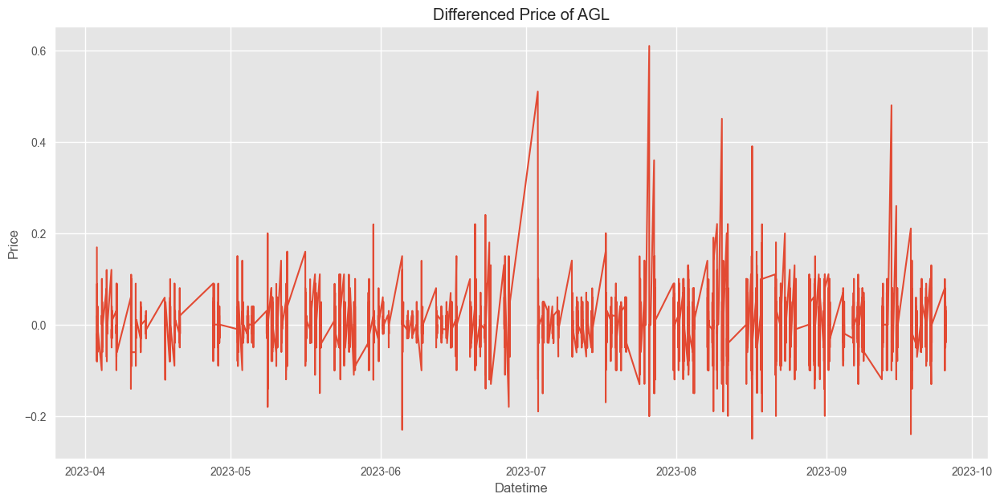

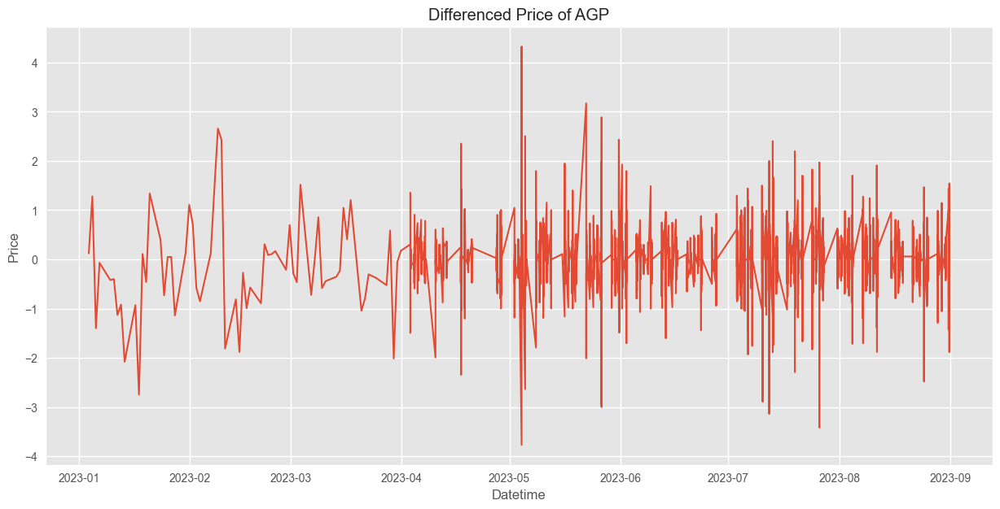

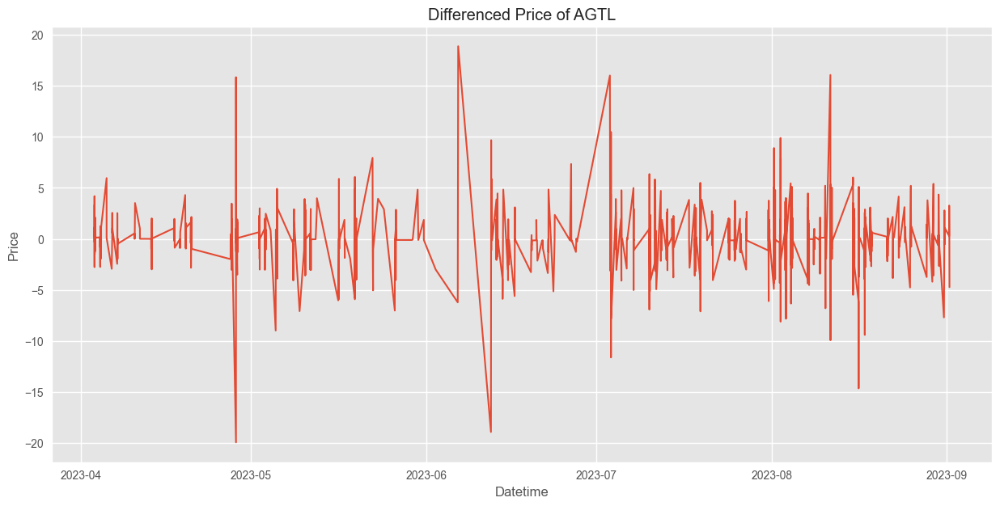

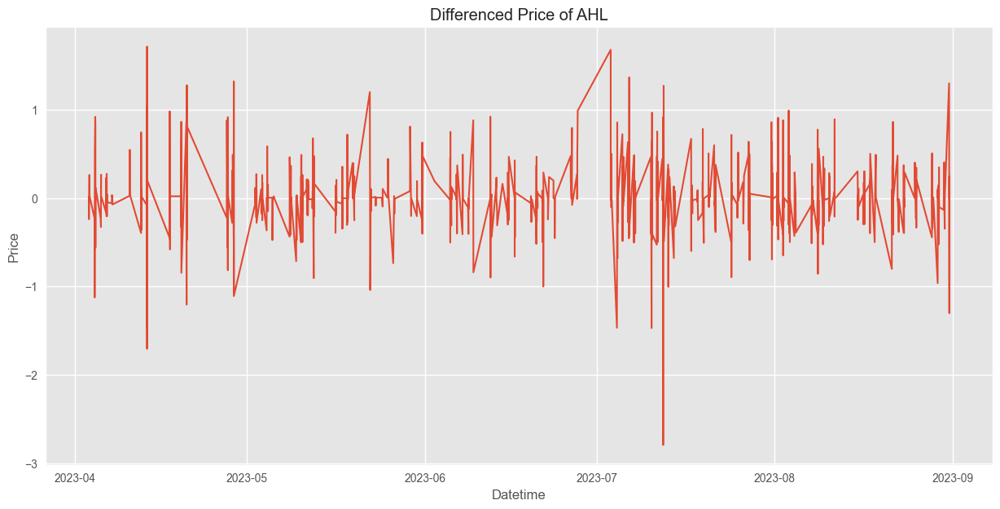

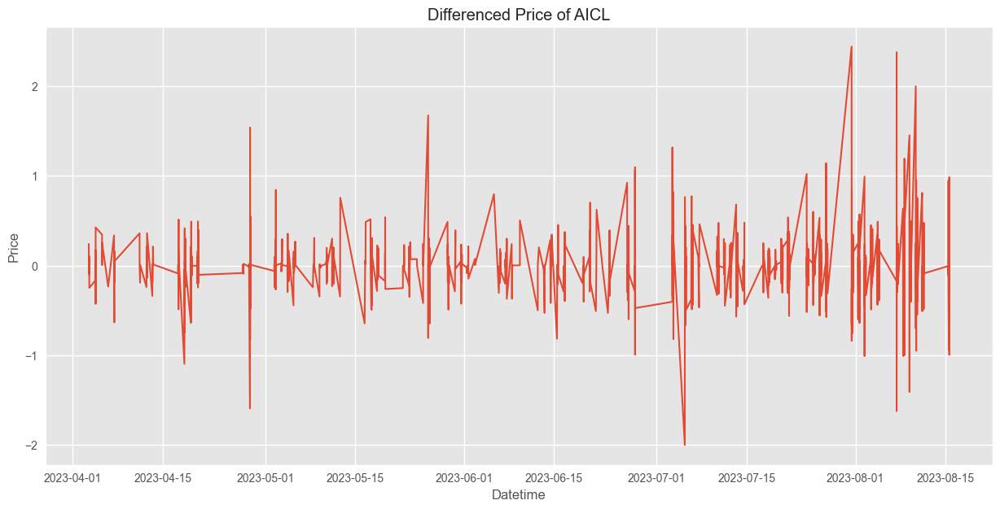

In [167]:
for i in stocks:
    plt.figure(figsize=(15, 7))
    stock = train[train['Scrip'] == i].set_index('Datetime')
    stock['Price'] = stock['Price'] - get_trend(stock['Price'])
    stock['Price'] = stock['Price'] - get_season(stock['Price'])
    
    sns.lineplot(data=stock['Price'].diff(), palette='tab10', linewidth=1.5)
    plt.title(f'Differenced Price of {i}')
    plt.show()

## Comparing Stocks Performance


In [168]:
stocks

['ABOT', 'ACPL', 'ADMM', 'AGHA', 'AGIL', 'AGL', 'AGP', 'AGTL', 'AHL', 'AICL']

In [169]:
ABOT = train[train['Scrip'] == 'ABOT'].set_index('Datetime')
ACPL = train[train['Scrip'] == 'ACPL'].set_index('Datetime')
ADMM = train[train['Scrip'] == 'ADMM'].set_index('Datetime')
AGHA = train[train['Scrip'] == 'AGHA'].set_index('Datetime')
AGIL = train[train['Scrip'] == 'AGIL'].set_index('Datetime')
AGL = train[train['Scrip'] == 'AGL'].set_index('Datetime')
AGP = train[train['Scrip'] == 'AGP'].set_index('Datetime')
AGTL = train[train['Scrip'] == 'AGTL'].set_index('Datetime')
AHL = train[train['Scrip'] == 'AHL'].set_index('Datetime')
AICL = train[train['Scrip'] == 'AICL'].set_index('Datetime')

In [170]:
fig = go.Figure()

for i in stocks:
    stock = train[train['Scrip'] == i].set_index('Datetime')
    first_val = stock['Price'][0]
    normalized = stock['Price'].div(first_val).mul(100)
    
    # Calculate the moving average (e.g., 30 days moving average)
    trend = normalized.rolling(window=30).mean()
    
    # Add trend line to the figure
    fig.add_trace(go.Scatter(
        x=trend.index,
        y=trend,
        mode='lines',
        name=i
    ))

fig.update_layout(
    title='Trend Lines of Normalized Prices of Stocks',
    xaxis_title='Date',
    yaxis_title='Normalized Price',
    legend_title='Stocks',
    template='plotly'
)

fig.show()


- This graph shows us that the ACPL and AGL more than 130% in 8 months
- While AHL, AGHA, AGP, AICL and ABOT have devalued about 5% to 15%.
- Other remained a constant postion with some up and down spikes


## Analyzing Seasonality of different Stocks


In [171]:
def analyze_seasonality(stock_name):
    stock = train[train['Scrip'] == stock_name].set_index('Datetime')
    stock['Price'] = pd.to_numeric(stock['Price'], errors='coerce')
    stock = stock.dropna(subset=['Price'])
    stock = stock.reset_index()
    stock = stock.rename(columns={'Datetime': 'ds', 'Price': 'y'})
    
    # Fit Prophet model
    model = Prophet(yearly_seasonality=True, daily_seasonality=True)
    model.fit(stock)
    
    future = model.make_future_dataframe(periods=0)  # No need for future prediction, just decomposition
    forecast = model.predict(future)
    
    # Check available seasonal components
    seasonal_components = [col for col in forecast.columns if 'seasonal' in col]
    
    if not seasonal_components:
        print(f"No seasonal components found for {stock_name}.")
        seasonal = pd.Series(0, index=forecast.index)
    else:
        # Extract seasonal component
        seasonal = forecast[seasonal_components].sum(axis=1)
    
    # Extract trend and residual components
    trend = forecast['trend']
    residual = stock['y'] - trend - seasonal
    
    # Plot the results
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(
        x=stock['ds'],
        y=stock['y'],
        mode='lines',
        name='Observed'
    ))
    
    fig.add_trace(go.Scatter(
        x=stock['ds'],
        y=trend,
        mode='lines',
        name='Trend'
    ))
    
    fig.add_trace(go.Scatter(
        x=stock['ds'],
        y=seasonal,
        mode='lines',
        name='Seasonal'
    ))
    
    fig.add_trace(go.Scatter(
        x=stock['ds'],
        y=residual,
        mode='lines',
        name='Residual'
    ))
    
    fig.update_layout(
        title=f'Prophet Decomposition of {stock_name}',
        xaxis_title='Date',
        yaxis_title='Price',
        legend_title='Components',
        template='plotly'
    )
    
    fig.show()

# Analyze seasonality for each stock
for stock_name in stocks:
    analyze_seasonality(stock_name)

11:04:14 - cmdstanpy - INFO - Chain [1] start processing
11:04:15 - cmdstanpy - INFO - Chain [1] done processing


No seasonal components found for ABOT.


11:04:16 - cmdstanpy - INFO - Chain [1] start processing
11:04:29 - cmdstanpy - INFO - Chain [1] done processing


No seasonal components found for ACPL.


11:04:31 - cmdstanpy - INFO - Chain [1] start processing
11:04:31 - cmdstanpy - INFO - Chain [1] done processing


No seasonal components found for ADMM.


11:04:33 - cmdstanpy - INFO - Chain [1] start processing
11:05:09 - cmdstanpy - INFO - Chain [1] done processing


No seasonal components found for AGHA.


11:05:12 - cmdstanpy - INFO - Chain [1] start processing
11:05:13 - cmdstanpy - INFO - Chain [1] done processing


No seasonal components found for AGIL.


11:05:15 - cmdstanpy - INFO - Chain [1] start processing
11:06:02 - cmdstanpy - INFO - Chain [1] done processing


No seasonal components found for AGL.


11:06:07 - cmdstanpy - INFO - Chain [1] start processing
11:06:31 - cmdstanpy - INFO - Chain [1] done processing


No seasonal components found for AGP.


11:06:34 - cmdstanpy - INFO - Chain [1] start processing
11:06:35 - cmdstanpy - INFO - Chain [1] done processing


No seasonal components found for AGTL.


11:06:35 - cmdstanpy - INFO - Chain [1] start processing
11:06:37 - cmdstanpy - INFO - Chain [1] done processing


No seasonal components found for AHL.


11:06:38 - cmdstanpy - INFO - Chain [1] start processing
11:06:43 - cmdstanpy - INFO - Chain [1] done processing


No seasonal components found for AICL.


Seasonality is not present in any of the stocks


## Time Series Modelling


#### Checking Time Series is stationary or not


In [172]:
import pandas as pd
from prophet import Prophet
from statsmodels.tsa.stattools import adfuller

# Function to analyze stationarity of stocks using ADF test
def analyze_stationarity(stocks, train):
    stationary_stocks = []
    non_stationary_stocks = []
    
    for i in stocks:
        stock = train[train['Scrip'] == i]
        stock['Price'] = pd.to_numeric(stock['Price'], errors='coerce')
        stock = stock.rename(columns={'Datetime': 'ds'})
        stock['y']=stock['Price']
        
        # Extract the time series values
        time_series = stock['y']
        
        # Perform the ADF test
        result = adfuller(time_series)
        
        # Extract the test statistics, p-value, and critical values
        adf_statistic = result[0]
        p_value = result[1]
        critical_values = result[4]
        
        # Print the results
        print(f'ADF Statistic for {i}: {adf_statistic}')
        print(f'p-value for {i}: {p_value}')
        print('Critical Values:')
        for key, value in critical_values.items():
            print(f'    {key}: {value}')

        # Check the p-value and ADF statistic against critical values to determine stationarity
        if p_value < 0.05 and adf_statistic < critical_values['5%']:
            print(f'The time series of {i} is stationary.\n\n')
            stationary_stocks.append(i)
        else:
            print(f'The time series of {i} is not stationary.\n\n')
            non_stationary_stocks.append(i)
    
    return stationary_stocks, non_stationary_stocks

analyze_stationarity(stocks, train)

ADF Statistic for ABOT: -1.9996475141636167
p-value for ABOT: 0.2867276733087676
Critical Values:
    1%: -3.4345353407734733
    5%: -2.86338857621683
    10%: -2.567754150088293
The time series of ABOT is not stationary.


ADF Statistic for ACPL: -3.062627430838122
p-value for ACPL: 0.029445417238792723
Critical Values:
    1%: -3.4314493316997745
    5%: -2.862025802824345
    10%: -2.567028590492608
The time series of ACPL is stationary.


ADF Statistic for ADMM: -2.602750524982143
p-value for ADMM: 0.09243012136487644
Critical Values:
    1%: -3.435699433298302
    5%: -2.863902271843875
    10%: -2.5680277086214076
The time series of ADMM is not stationary.


ADF Statistic for AGHA: -1.8111501667469496
p-value for AGHA: 0.3749401652996318
Critical Values:
    1%: -3.430831275614644
    5%: -2.8617527013811195
    10%: -2.566883216092428
The time series of AGHA is not stationary.


ADF Statistic for AGIL: -1.8185979515646775
p-value for AGIL: 0.371268197587888
Critical Values:
   

(['ACPL'],
 ['ABOT', 'ADMM', 'AGHA', 'AGIL', 'AGL', 'AGP', 'AGTL', 'AHL', 'AICL'])

Hence only stock ACPL is stationary


#### Converting Non-Stationary to Stationary Time Series


ADF Statistic for ABOT: -1.9996475141636167
p-value for ABOT: 0.2867276733087676
Critical Values:
    1%: -3.4345353407734733
    5%: -2.86338857621683
    10%: -2.567754150088293
The time series of ABOT is not stationary.


ADF Statistic for ACPL: -3.062627430838122
p-value for ACPL: 0.029445417238792723
Critical Values:
    1%: -3.4314493316997745
    5%: -2.862025802824345
    10%: -2.567028590492608
The time series of ACPL is stationary.


ADF Statistic for ADMM: -2.602750524982143
p-value for ADMM: 0.09243012136487644
Critical Values:
    1%: -3.435699433298302
    5%: -2.863902271843875
    10%: -2.5680277086214076
The time series of ADMM is not stationary.


ADF Statistic for AGHA: -1.8111501667469496
p-value for AGHA: 0.3749401652996318
Critical Values:
    1%: -3.430831275614644
    5%: -2.8617527013811195
    10%: -2.566883216092428
The time series of AGHA is not stationary.


ADF Statistic for AGIL: -1.8185979515646775
p-value for AGIL: 0.371268197587888
Critical Values:
   

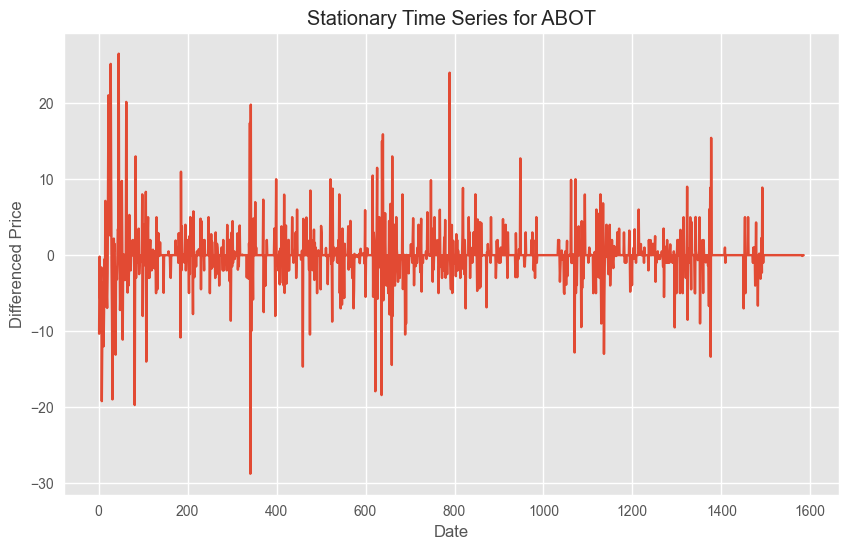

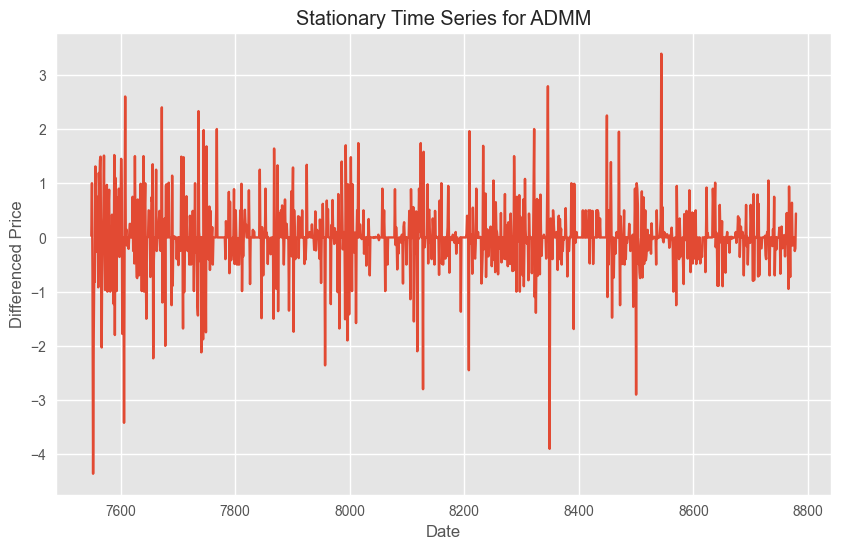

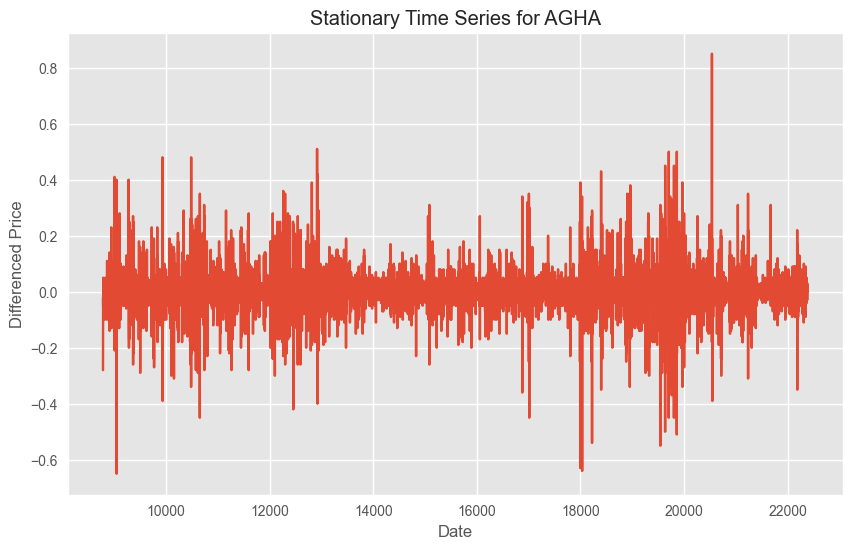

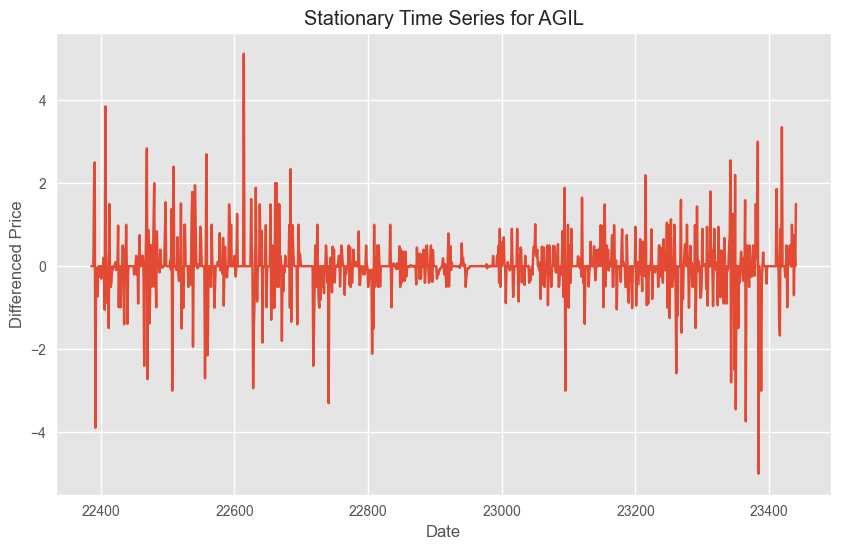

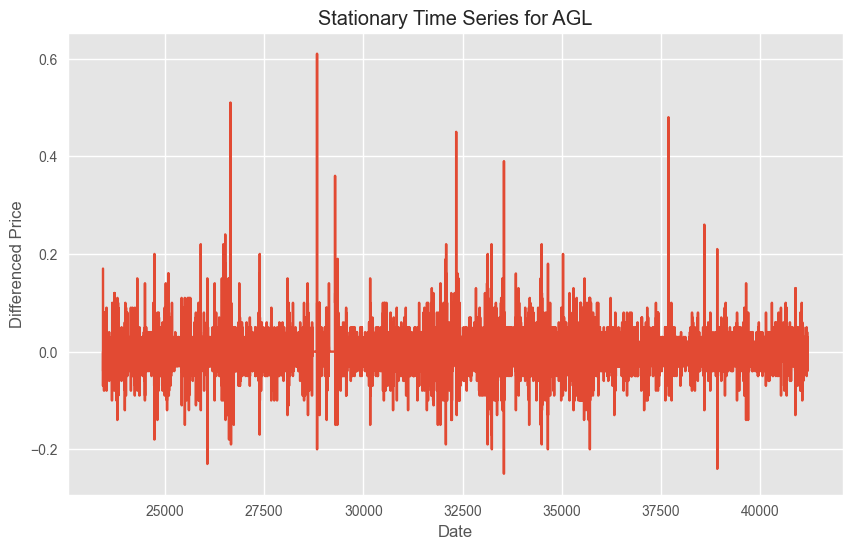

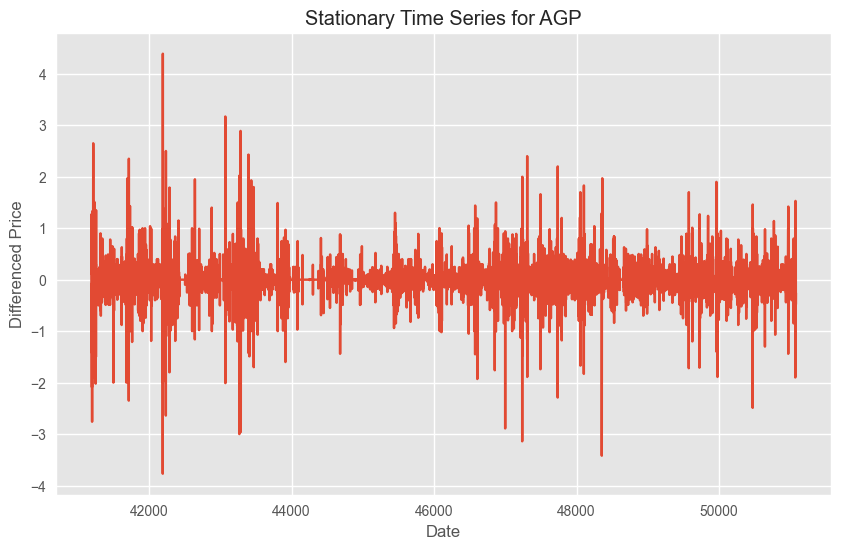

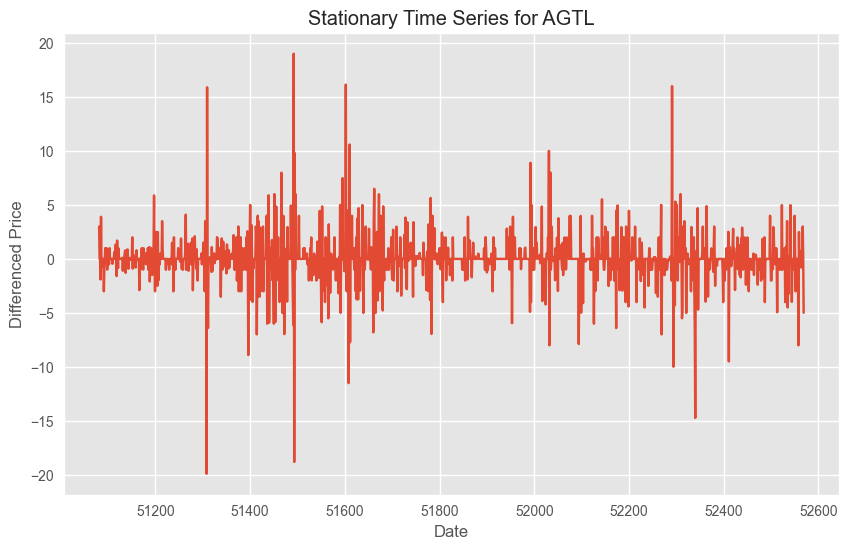

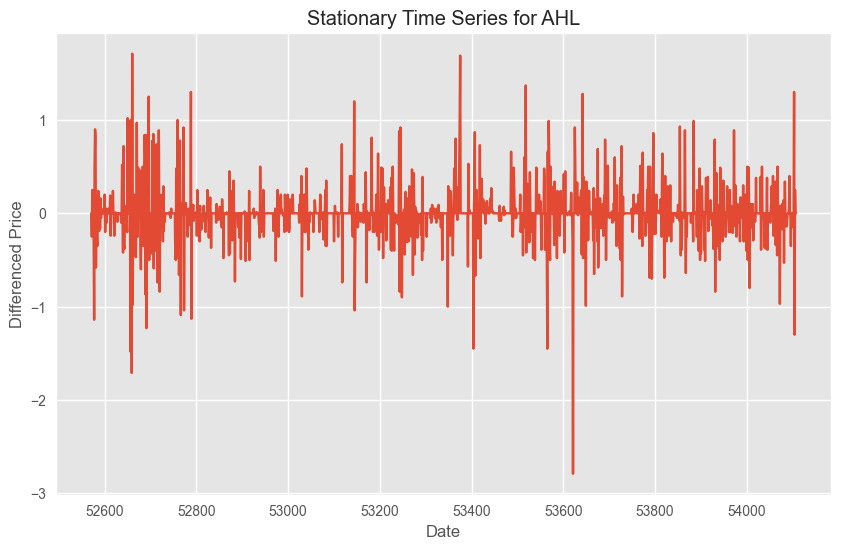

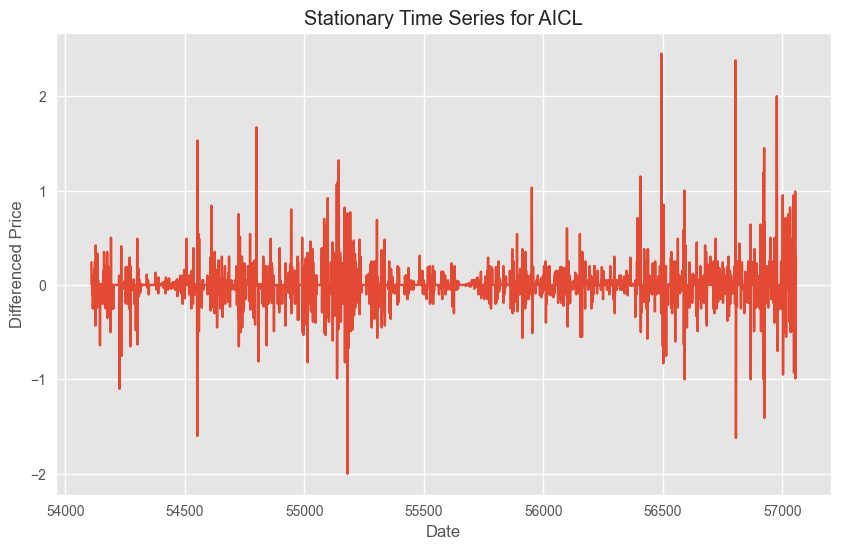

Stationary stocks by default: ['ACPL']
Non-stationary stocks converted to stationary: ['ABOT', 'ADMM', 'AGHA', 'AGIL', 'AGL', 'AGP', 'AGTL', 'AHL', 'AICL']


In [173]:
import pandas as pd
from prophet import Prophet
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt

# Function to make non-stationary time series stationary
def make_stationary(stock_name, train):
    stock = train[train['Scrip'] == stock_name]
    stock['Price'] = pd.to_numeric(stock['Price'], errors='coerce')
    
    # Apply differencing to make the series stationary
    stock['Price_diff'] = stock['Price'].diff().dropna()
    
    # Add the differenced price to the original DataFrame
    train.loc[train['Scrip'] == stock_name, 'Price_diff'] = stock['Price_diff']
                                                                  
    return stock

# Analyze stationarity and get lists of stationary and non-stationary stocks
stationary_stocks, non_stationary_stocks = analyze_stationarity(stocks, train)

# Convert non-stationary stocks to stationary
for stock_name in non_stationary_stocks:
    stationary_stock = make_stationary(stock_name, train)
    plt.figure(figsize=(10, 6))
    plt.plot(stationary_stock.index, stationary_stock['Price_diff'])
    plt.title(f'Stationary Time Series for {stock_name}')
    plt.xlabel('Date')
    plt.ylabel('Differenced Price')
    plt.show()

print(f'Stationary stocks by default: {stationary_stocks}')
print(f'Non-stationary stocks converted to stationary: {non_stationary_stocks}')


## Time Series Forcasting


#### SMAPE (Symmetric Mean Absolute Percentage Error)


In [174]:
def calculate_smape(actual, predicted) -> float: 
    # Convert actual and predicted to numpy array data type if not already 
    if not all([isinstance(actual, np.ndarray), isinstance(predicted, np.ndarray)]): 
        actual, predicted = np.array(actual), np.array(predicted)
    
    return round(np.mean(np.abs(predicted - actual) / ((np.abs(predicted) + np.abs(actual)) / 2)) * 100, 2)


#### RMSE (Root Mean Squared Error)


In [175]:
from sklearn.metrics import mean_squared_error
from math import sqrt

# Function to calculate RMSE
def rmse(predictions, targets):
    return sqrt(mean_squared_error(targets, predictions))

#### Statistical Models


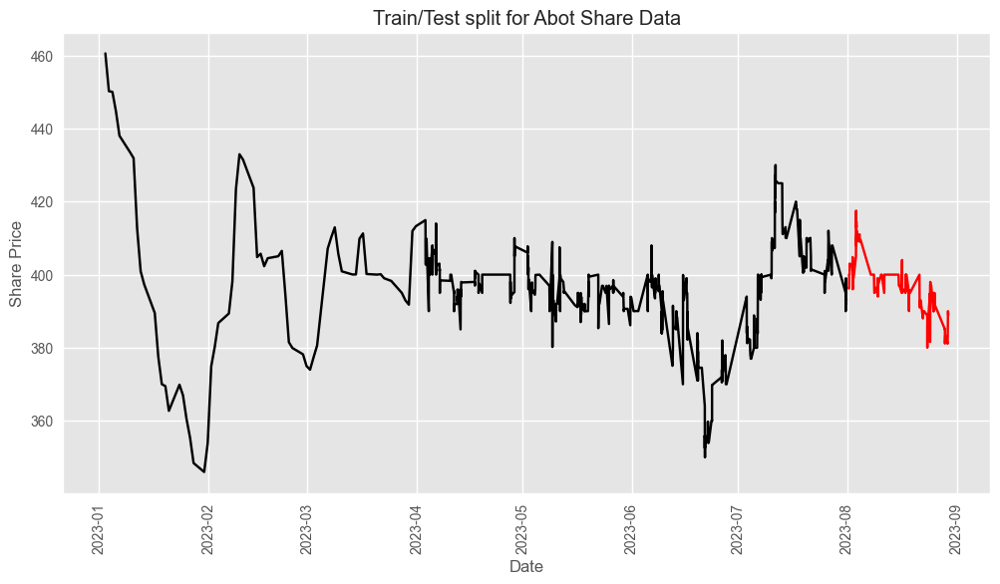

In [177]:
# split data into train and test sets
train_ABOT = ABOT[ABOT.index < pd.to_datetime("2023-08-01", format='%Y-%m-%d')]
test_ABOT = ABOT[ABOT.index >= pd.to_datetime("2023-08-01", format='%Y-%m-%d')]

plt.figure(figsize=(12,6))
plt.plot(train_ABOT.Price, color = "black")
plt.plot(test_ABOT.Price, color = "red")
plt.ylabel('Share Price')
plt.xlabel('Date')
plt.xticks(rotation=90)
plt.title("Train/Test split for Abot Share Data")
plt.show()

In [215]:
train.drop(['Datetime','ID'], axis=1, inplace=True)
train.head()

,Scrip,Price,Volume,Open_daily,LDCP,Year,Month,Day,DayOfWeek,Hour
0,ABOT,460.53,7500,456.14,463.31,2023,1,2,0,18
1,ABOT,450.20,10400,455.00,460.53,2023,1,3,1,18
2,ABOT,450.00,3350,450.00,450.20,2023,1,4,2,18
3,ABOT,444.69,11200,445.00,450.00,2023,1,5,3,18
4,ABOT,438.00,8900,444.00,444.69,2023,1,6,4,18


In [216]:
test['Datetime'] = pd.to_datetime(test['Datetime'])
test['Year']=test['Datetime'].dt.year
test['Month']=test['Datetime'].dt.month
test['Day']=test['Datetime'].dt.day
test['DayOfWeek']=test['Datetime'].dt.dayofweek
test['Hour']=test['Datetime'].dt.hour
test.drop(['Datetime','Date'], axis=1, inplace=True)
test.head()

,ID,Scrip,Volume,Open_daily,LDCP,Year,Month,Day,DayOfWeek,Hour
0,4015,ABOT,500,381.11,383.41,2023,8,29,1,14
1,4016,ABOT,100,381.11,383.41,2023,8,29,1,14
2,4017,ABOT,52000,381.11,383.41,2023,8,29,1,18
3,4018,ABOT,500,381.61,388.49,2023,8,30,2,13
4,4019,ABOT,400,381.61,388.49,2023,8,30,2,13


Best AutoReg parameters: {'lags': 8}
RMSE Results:
AR: 8.388419130298328
ARIMA: 5.197639891223752
SARIMA: 13.721195095835686
SARIMAX: 31.543097943593303
VAR: 8.638182249257456
SES: 8.978760369600499
HWES: 8.830301564461971

SMAPE Results:
AR: 1.64
ARIMA: 1.03
SARIMA: 3.22
SARIMAX: 7.44
VAR: 1.7
SES: 1.76
HWES: 1.73


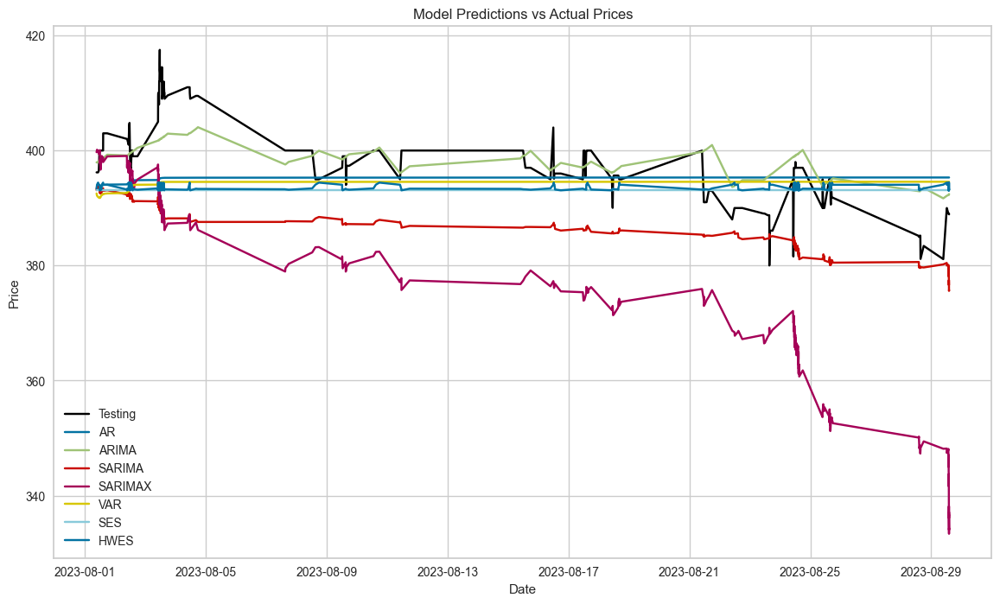

In [139]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing

# Prepare results dictionary to store RMSE and SMAPE values
results_rmse = {}
results_smape = {}

# Function to perform grid search for AutoReg model
def grid_search_autoreg(train_data, test_data, max_lags=10):
    best_rmse = np.inf
    best_params = {}
    for lag in range(1, max_lags+1):
        model = AutoReg(train_data, lags=lag)
        model_fit = model.fit()
        pred = model_fit.predict(start=len(train_data), end=len(train_data) + len(test_data) - 1, dynamic=False)
        rmse_val = rmse(pred, test_data)
        if rmse_val < best_rmse:
            best_rmse = rmse_val
            best_params['lags'] = lag
    return best_params

autoreg_params = grid_search_autoreg(train_ABOT['Price'], test_ABOT['Price'])
print(f"Best AutoReg parameters: {autoreg_params}")

# AR model
model_ar = AutoReg(train_ABOT['Price'], lags=autoreg_params['lags'])
model_ar_fit = model_ar.fit()
pred_ar = model_ar_fit.predict(start=len(train_ABOT), end=len(train_ABOT) + len(test_ABOT) - 1, dynamic=False)
results_rmse['AR'] = rmse(pred_ar, test_ABOT['Price'])
results_smape['AR'] = calculate_smape(test_ABOT['Price'], pred_ar)

# ARIMA model
model_arima = ARIMA(train_ABOT['Price'], exog=train_ABOT[['Open_daily', 'LDCP', 'Year', 'Volume','Month','DayOfWeek', 'Hour']], order=(2, 1, 2))
model_arima_fit = model_arima.fit()
pred_arima = model_arima_fit.predict(start=len(train_ABOT), end=len(train_ABOT) + len(test_ABOT) - 1, dynamic=False, exog=test_ABOT[['Open_daily', 'LDCP', 'Year', 'Volume','Month','DayOfWeek', 'Hour']])
results_rmse['ARIMA'] = rmse(pred_arima, test_ABOT['Price'])
results_smape['ARIMA'] = calculate_smape(test_ABOT['Price'], pred_arima)

# SARIMA model
model_sarima = SARIMAX(train_ABOT['Price'], order=(2, 1, 2), seasonal_order=(1, 1, 1, 12))
model_sarima_fit = model_sarima.fit(disp=False)
pred_sarima = model_sarima_fit.predict(start=len(train_ABOT), end=len(train_ABOT) + len(test_ABOT) - 1, dynamic=False)
results_rmse['SARIMA'] = rmse(pred_sarima, test_ABOT['Price'])
results_smape['SARIMA'] = calculate_smape(test_ABOT['Price'], pred_sarima)

# SARIMAX model
# We'll assume 'Volume' as an exogenous variable for SARIMAX
model_sarimax = SARIMAX(train_ABOT['Price'], exog=train_ABOT[['Open_daily', 'LDCP', 'Year', 'Volume','Month','DayOfWeek', 'Hour']], order=(2, 1, 2), seasonal_order=(1, 1, 1, 12))
model_sarimax_fit = model_sarimax.fit(disp=False)
pred_sarimax = model_sarimax_fit.predict(start=len(train_ABOT), end=len(train_ABOT) + len(test_ABOT) - 1, exog=test_ABOT[['Open_daily', 'LDCP', 'Year', 'Volume','Month','DayOfWeek', 'Hour']], dynamic=False)
results_rmse['SARIMAX'] = rmse(pred_sarimax, test_ABOT['Price'])
results_smape['SARIMAX'] = calculate_smape(test_ABOT['Price'], pred_sarimax)

# VAR model
# For VAR, we'll use 'Price' and 'Volume'
train_var = train_ABOT[['Price','Open_daily', 'LDCP', 'Volume', 'Hour']]
model_var = VAR(train_var)
model_var_fit = model_var.fit()
pred_var = model_var_fit.forecast(train_var.values[-model_var_fit.k_ar:], steps=len(test_ABOT))
pred_var = pd.DataFrame(pred_var, index=test_ABOT.index, columns=['Price', 'Open_daily', 'LDCP', 'Volume', 'Hour'])
results_rmse['VAR'] = rmse(pred_var['Price'], test_ABOT['Price'])
results_smape['VAR'] = calculate_smape(test_ABOT['Price'], pred_var['Price'])

# SES model
model_ses = SimpleExpSmoothing(train_ABOT['Price'])
model_ses_fit = model_ses.fit()
pred_ses = model_ses_fit.predict(start=len(train_ABOT), end=len(train_ABOT) + len(test_ABOT) - 1)
results_rmse['SES'] = rmse(pred_ses, test_ABOT['Price'])
results_smape['SES'] = calculate_smape(test_ABOT['Price'], pred_ses)

# HWES model
model_hwes = ExponentialSmoothing(train_ABOT['Price'], seasonal='add', seasonal_periods=12)
model_hwes_fit = model_hwes.fit()
pred_hwes = model_hwes_fit.predict(start=len(train_ABOT), end=len(train_ABOT) + len(test_ABOT) - 1)
results_rmse['HWES'] = rmse(pred_hwes, test_ABOT['Price'])
results_smape['HWES'] = calculate_smape(test_ABOT['Price'], pred_hwes)

# Print RMSE and SMAPE results
print("RMSE Results:")
for model_name, rmse_value in results_rmse.items():
    print(f'{model_name}: {rmse_value}')

print("\nSMAPE Results:")
for model_name, smape_value in results_smape.items():
    print(f'{model_name}: {smape_value}')

# Plot the results
plt.figure(figsize=(14, 8))
plt.plot(test_ABOT.index, test_ABOT['Price'], color= 'black', label='Testing')
plt.plot(test_ABOT.index, pred_ar, label='AR')
plt.plot(test_ABOT.index, pred_arima, label='ARIMA')
plt.plot(test_ABOT.index, pred_sarima, label='SARIMA')
plt.plot(test_ABOT.index, pred_sarimax, label='SARIMAX')
plt.plot(test_ABOT.index, pred_var['Price'], label='VAR')
plt.plot(test_ABOT.index, pred_ses, label='SES')
plt.plot(test_ABOT.index, pred_hwes, label='HWES')

plt.legend()
plt.title('Model Predictions vs Actual Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

In [33]:
train.set_index('Datetime', inplace=True)
test.set_index('Datetime', inplace=True)

In [34]:
test.Scrip.value_counts()

Scrip
AGL     4437
AGHA    3402
AGP     2473
ACPL    1491
AICL     738
ABOT     397
AHL      385
AGTL     373
ADMM     308
AGIL     265
Name: count, dtype: int64

#### Predicting Test Results and Making Submission CSV for each Statistical Model


In [219]:
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing

# Placeholder for RMSE and SMAPE results
results_rmse = {}
results_smape = {}

# Define the models to use
model_names = ['AR', 'ARIMA', 'SARIMAX', 'VAR', 'SES', 'HWES']

# Prepare submission dataframes
submissions = {name: pd.DataFrame(columns=['ID', 'Price']) for name in model_names}

# Iterate over each stock and train/predict models
for stock_name in stocks:
    train_stock = train[train['Scrip'] == stock_name]
    test_stock = test[test['Scrip'] == stock_name]

    # AR model
    model_ar = AutoReg(train_stock['Price'], lags=10)
    model_ar_fit = model_ar.fit()
    pred_ar = model_ar_fit.predict(start=len(train_stock), end=len(train_stock) + len(test_stock) - 1, dynamic=False)
    pred_ar = pred_ar[:len(test_stock)]  # Ensure the prediction length matches the test data length
    submissions['AR'] = pd.concat([submissions['AR'], pd.DataFrame({'ID': test[test['Scrip'] == stock_name]['ID'], 'Price': pred_ar.values})])

    # ARIMA model
    model_arima = ARIMA(train_stock['Price'], exog=train_stock[['Open_daily', 'LDCP', 'Year', 'Volume','Month','DayOfWeek', 'Hour']], order=(2, 1, 2))
    model_arima_fit = model_arima.fit()
    pred_arima = model_arima_fit.predict(start=len(train_stock), end=len(train_stock) + len(test_stock) - 1, dynamic=False, exog=test_stock[['Open_daily', 'LDCP', 'Year', 'Volume','Month','DayOfWeek', 'Hour']])
    pred_arima = pred_arima[:len(test_stock)]  # Ensure the prediction length matches the test data length
    submissions['ARIMA'] = pd.concat([submissions['ARIMA'], pd.DataFrame({'ID': test[test['Scrip'] == stock_name]['ID'], 'Price': pred_arima.values})])

    # SARIMAX model
    model_sarimax = SARIMAX(train_stock['Price'], exog=train_stock[['Open_daily', 'LDCP', 'Year', 'Volume','Month','DayOfWeek', 'Hour']], order=(2, 1, 2), seasonal_order=(1, 1, 1, 12))
    model_sarimax_fit = model_sarimax.fit(disp=False)
    pred_sarimax = model_sarimax_fit.predict(start=len(train_stock), end=len(train_stock) + len(test_stock) - 1, exog=test_stock[['Open_daily', 'LDCP', 'Year', 'Volume','Month','DayOfWeek', 'Hour']], dynamic=False)
    pred_sarimax = pred_sarimax[:len(test_stock)]  # Ensure the prediction length matches the test data length
    submissions['SARIMAX'] = pd.concat([submissions['SARIMAX'], pd.DataFrame({'ID': test[test['Scrip'] == stock_name]['ID'], 'Price': pred_sarimax.values})])

    # VAR model
    train_var = train_stock[['Price', 'Volume']]
    model_var = VAR(train_var, exog=train_stock[['Open_daily', 'LDCP', 'Year', 'Volume','Month','DayOfWeek', 'Hour']])
    model_var_fit = model_var.fit()
    pred_var = model_var_fit.forecast(model_var_fit.endog, steps=len(test_stock), exog_future=test_stock[['Open_daily', 'LDCP', 'Year', 'Volume','Month','DayOfWeek', 'Hour']])
    pred_var = pd.DataFrame(pred_var, index=test_stock.index, columns=['Price', 'Volume'])
    pred_var = pred_var.iloc[:len(test_stock)]  # Ensure the prediction length matches the test data length
    submissions['VAR'] = pd.concat([submissions['VAR'], pd.DataFrame({'ID': test[test['Scrip'] == stock_name]['ID'], 'Price': pred_var['Price'].values})])

    # SES model
    model_ses = SimpleExpSmoothing(train_stock['Price'])
    model_ses_fit = model_ses.fit()
    pred_ses = model_ses_fit.predict(start=len(train_stock), end=len(train_stock) + len(test_stock) - 1)
    pred_ses = pred_ses[:len(test_stock)]  # Ensure the prediction length matches the test data length
    submissions['SES'] = pd.concat([submissions['SES'], pd.DataFrame({'ID': test[test['Scrip'] == stock_name]['ID'], 'Price': pred_ses.values})])

    # HWES model
    model_hwes = ExponentialSmoothing(train_stock['Price'], seasonal='add', seasonal_periods=12)
    model_hwes_fit = model_hwes.fit()
    pred_hwes = model_hwes_fit.predict(start=len(train_stock), end=len(train_stock) + len(test_stock) - 1)
    pred_hwes = pred_hwes[:len(test_stock)]  # Ensure the prediction length matches the test data length
    submissions['HWES'] = pd.concat([submissions['HWES'], pd.DataFrame({'ID': test[test['Scrip'] == stock_name]['ID'], 'Price': pred_hwes.values})])

# Save submission files
for model_name in model_names:
    submissions[model_name] = submissions[model_name].sort_values('ID')
    submissions[model_name].to_csv(f'submission_{model_name.lower()}.csv', index=False)

#### Using Meta's Prophet Model


In [36]:
# Import Prophet
from prophet import Prophet

# Define the model names
model_names = ['Prophet']

# Prepare submission dataframes
submissions = {name: pd.DataFrame(columns=['ID', 'Price']) for name in model_names}

# Iterate over each stock and train/predict models
for stock_name in stocks:
    train_stock = train[train['Scrip'] == stock_name]
    test_stock = test[test['Scrip'] == stock_name]

    # Iterate over each model
    for model_name in model_names:
        if model_name == 'Prophet':
            # Prepare data for Prophet
            train_prophet = train_stock.reset_index().rename(columns={'Datetime': 'ds', 'Price': 'y'})
            test_prophet = test_stock.reset_index().rename(columns={'Datetime': 'ds', 'Price': 'y'})
            
            # Initialize and fit Prophet model
            model_prophet = Prophet()
            model_prophet.fit(train_prophet)
            
            # Make predictions
            future = model_prophet.make_future_dataframe(periods=len(test_stock))
            forecast = model_prophet.predict(future)
            pred_prophet = forecast.iloc[-len(test_stock):]['yhat']
        else:
            # Train and predict other models
            # Use the existing code for other models here...
            continue

        # Ensure the prediction length matches the test data length
        pred_prophet = pred_prophet[:len(test_stock)]
        
        # Concatenate predictions to submission dataframe
        submissions[model_name] = pd.concat([submissions[model_name], pd.DataFrame({'ID': test[test['Scrip'] == stock_name]['ID'], 'Price': pred_prophet.values})])

# Save submission files
for model_name in model_names:
    submissions[model_name] = submissions[model_name].sort_values('ID')
    submissions[model_name].to_csv(f'submission_{model_name.lower()}.csv', index=False)


08:34:27 - cmdstanpy - INFO - Chain [1] start processing
08:34:28 - cmdstanpy - INFO - Chain [1] done processing
08:34:28 - cmdstanpy - INFO - Chain [1] start processing
08:34:38 - cmdstanpy - INFO - Chain [1] done processing
08:34:39 - cmdstanpy - INFO - Chain [1] start processing
08:34:39 - cmdstanpy - INFO - Chain [1] done processing
08:34:40 - cmdstanpy - INFO - Chain [1] start processing
08:35:02 - cmdstanpy - INFO - Chain [1] done processing
08:35:04 - cmdstanpy - INFO - Chain [1] start processing
08:35:05 - cmdstanpy - INFO - Chain [1] done processing
08:35:07 - cmdstanpy - INFO - Chain [1] start processing
08:35:52 - cmdstanpy - INFO - Chain [1] done processing
08:35:55 - cmdstanpy - INFO - Chain [1] start processing
08:36:13 - cmdstanpy - INFO - Chain [1] done processing
08:36:16 - cmdstanpy - INFO - Chain [1] start processing
08:36:17 - cmdstanpy - INFO - Chain [1] done processing
08:36:18 - cmdstanpy - INFO - Chain [1] start processing
08:36:19 - cmdstanpy - INFO - Chain [1]

#### Machine Learning Models


In [37]:
test.head()

,ID,Scrip,Volume,Date,Open_daily,LDCP
Datetime,,,,,,
2023-08-29 14:19:57,4015,ABOT,500,2023-08-29,381.11,383.41
2023-08-29 14:43:36,4016,ABOT,100,2023-08-29,381.11,383.41
2023-08-29 18:00:00,4017,ABOT,52000,2023-08-29,381.11,383.41
2023-08-30 13:37:51,4018,ABOT,500,2023-08-30,381.61,388.49
2023-08-30 13:38:23,4019,ABOT,400,2023-08-30,381.61,388.49


In [38]:
test.reset_index(inplace=True)
test['Datetime'] = pd.to_datetime(test['Datetime'])

In [39]:
test['Year'] = test['Datetime'].dt.year
test['Month'] = test['Datetime'].dt.month
test['Day'] = test['Datetime'].dt.day
test['DayOfWeek'] = test['Datetime'].dt.dayofweek
test['Hour'] = test['Datetime'].dt.hour

In [40]:
test.set_index('Datetime', inplace=True)

In [41]:
test.drop(['ID', 'Date'], axis=1, inplace=True)

##### Data Modelling for Training


In [42]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()
test['Scrip'] = lb.fit_transform(test['Scrip'])
train['Scrip'] = lb.fit_transform(train['Scrip'])

In [43]:
train_test = train[train.index >= '2023-08-01']
train_train = train[train.index < '2023-08-01']

In [44]:
from pycaret.regression import *
s = setup(data=train_train, test_data=train_test, target='Price', fold_strategy='timeseries', numeric_features=['Year', 'Scrip', 'Volume', 'Open_daily', 'LDCP', 'Month', 'Day', 'Hour', 'DayOfWeek'], fold=15, transform_target=True, session_id=123, data_split_shuffle=False, fold_shuffle=False, index=False)

,Description,Value
0,Session id,123
1,Target,Price
2,Target type,Regression
3,Original data shape,"(60898, 10)"
4,Transformed data shape,"(60898, 10)"
5,Transformed train set shape,"(38269, 10)"
6,Transformed test set shape,"(22629, 10)"
7,Numeric features,9
8,Preprocess,True
9,Imputation type,simple


In [56]:
best = compare_models(sort = 'MAPE')
best

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,08:39:03
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,9.3603,1478.8507,38.0765,0.7520,0.4142,0.2299,0.7207
gbr,Gradient Boosting Regressor,11.6325,1701.9112,40.1965,0.7252,0.4139,0.2397,0.4047
lightgbm,Light Gradient Boosting Machine,12.1574,1772.9316,40.3668,0.7208,0.4266,0.2621,0.1080
rf,Random Forest Regressor,12.9114,1930.1230,42.2672,0.6939,0.4373,0.2655,1.2593
xgboost,Extreme Gradient Boosting,13.4936,2006.8687,42.7330,0.6859,0.4547,0.2983,0.0827
dt,Decision Tree Regressor,15.4073,3384.3932,50.1240,0.5151,0.4940,0.3368,0.0433
knn,K Neighbors Regressor,12.7304,1980.6403,43.8855,0.6764,0.5165,0.3818,0.0540
ada,AdaBoost Regressor,21.4587,3229.8732,55.6191,0.4850,0.4988,0.4116,0.1213
llar,Lasso Least Angle Regression,35.1904,6309.0097,78.2743,-0.1178,0.8484,1.1009,0.0267
lasso,Lasso Regression,35.2113,6316.2105,78.3311,-0.1189,0.8484,1.1009,0.0307


ExtraTreesRegressor(n_jobs=-1, random_state=123)

In [46]:
predictions_future = predict_model(best, data=test)

# Print model name and predictions
print("Model Name: ", type(best).__name__)
print("Predictions: ", pd.DataFrame(predictions_future.head()))


Model Name:  ExtraTreesRegressor
Predictions:     Scrip  Volume  Open_daily        LDCP  Year  Month  Day  DayOfWeek  Hour  \
0      0     500  381.109985  383.410004  2023      8   29          1    14   
1      0     100  381.109985  383.410004  2023      8   29          1    14   
2      0   52000  381.109985  383.410004  2023      8   29          1    18   
3      0     500  381.609985  388.489990  2023      8   30          2    13   
4      0     400  381.609985  388.489990  2023      8   30          2    13   

   prediction_label  
0        368.628185  
1        368.189466  
2        110.965779  
3        386.921669  
4        387.063281  


In [47]:
predictions_future['prediction_label'].to_csv('submission_ExtraTreesRegressor1.csv', index=False)

In [48]:
id = pd.read_csv('submission_var.csv')['ID']

In [49]:
et_model = create_model('rf')
predictions_future = predict_model(et_model, data=test)

# Print model name and predictions
print("Model Name: ", type(best).__name__)
print("Predictions: ", pd.DataFrame(predictions_future.head()))
predictions_future['prediction_label'].to_csv('submission_rf.csv', index=False)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,11.2080,1615.8099,40.1971,0.7713,0.3548,0.1782
1,42.7679,6705.7310,81.8885,0.2251,0.6477,0.6376
2,8.5291,1410.7854,37.5604,0.7809,0.4329,0.2358
3,13.2046,1886.3131,43.4317,0.6869,0.4758,0.2776
4,10.9500,1355.6070,36.8186,0.7114,0.3811,0.2035
5,11.3885,1843.1645,42.9321,0.7937,0.4195,0.1992
6,13.9995,2385.0228,48.8367,0.6835,0.4772,0.2840
7,13.1939,1758.6098,41.9358,0.6516,0.4543,0.2758
8,10.9774,1292.8013,35.9555,0.7997,0.4001,0.2229


Model Name:  ExtraTreesRegressor
Predictions:     Scrip  Volume  Open_daily        LDCP  Year  Month  Day  DayOfWeek  Hour  \
0      0     500  381.109985  383.410004  2023      8   29          1    14   
1      0     100  381.109985  383.410004  2023      8   29          1    14   
2      0   52000  381.109985  383.410004  2023      8   29          1    18   
3      0     500  381.609985  388.489990  2023      8   30          2    13   
4      0     400  381.609985  388.489990  2023      8   30          2    13   

   prediction_label  
0        376.493811  
1        346.925382  
2         99.807792  
3        388.385669  
4        366.390449  


In [50]:
lightgbm_model = create_model('lightgbm')
predictions_future = predict_model(lightgbm_model, data=test)

# Print model name and predictions
print("Model Name: ", type(best).__name__)
print("Predictions: ", pd.DataFrame(predictions_future.head()))
predictions_future['prediction_label'].to_csv('submission_lightgbm1.csv', index=False)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,11.9752,1604.4764,40.0559,0.7729,0.3658,0.2167
1,41.6625,6468.6218,80.4277,0.2525,0.6408,0.6210
2,9.5873,1429.0953,37.8034,0.7781,0.4199,0.2313
3,10.8475,1654.8895,40.6803,0.7253,0.4499,0.2389
4,9.5102,1237.3551,35.1761,0.7365,0.3685,0.1877
5,12.4198,1848.1241,42.9898,0.7932,0.4180,0.2002
6,12.9135,2212.1650,47.0337,0.7065,0.4622,0.2601
7,11.1764,1562.9686,39.5344,0.6903,0.4403,0.2498
8,11.9175,1285.8224,35.8584,0.8007,0.3931,0.2360


Model Name:  ExtraTreesRegressor
Predictions:     Scrip  Volume  Open_daily        LDCP  Year  Month  Day  DayOfWeek  Hour  \
0      0     500  381.109985  383.410004  2023      8   29          1    14   
1      0     100  381.109985  383.410004  2023      8   29          1    14   
2      0   52000  381.109985  383.410004  2023      8   29          1    18   
3      0     500  381.609985  388.489990  2023      8   30          2    13   
4      0     400  381.609985  388.489990  2023      8   30          2    13   

   prediction_label  
0        278.046502  
1        371.724456  
2        104.455742  
3        319.387254  
4        293.284944  


#### Stacking Multiple Models


In [220]:
arima = pd.read_csv('submission_arima.csv')
var = pd.read_csv('submission_var.csv')
gradient = pd.read_csv('submission_GradientBoostingRegressor.csv')
ar = pd.read_csv('submission_ar.csv')


In [221]:
merged_df = arima[['ID']].copy()
merged_df['ARIMA'] = arima['Price']
merged_df['VAR'] = var['Price']
merged_df['GBR'] = gradient['Price']
merged_df['AR'] = ar['Price'] 

In [225]:
from sklearn.ensemble import GradientBoostingRegressor, VotingRegressor

merged_df['Actual'] = merged_df['ARIMA']

# Create training data for the Voting Regressor
X = merged_df[['ARIMA', 'VAR', 'GBR','AR']]
y = merged_df['Actual']

# Train a Voting Regressor
voting_regressor = VotingRegressor([
    ('arima', GradientBoostingRegressor()),  # Replace with the actual ARIMA model if needed
    ('var', GradientBoostingRegressor()),    # Replace with the actual VAR model if needed
    ('gbr', GradientBoostingRegressor()),
    ('ar', GradientBoostingRegressor())
])
voting_regressor.fit(X, y)

# Predict using the Voting Regressor
stacked_predictions = voting_regressor.predict(X)

# Calculate SMAPE using ARIMA predictions as actual values for demonstration
smape = calculate_smape(merged_df['Actual'], stacked_predictions)
print(f'SMAPE: {smape:.2f}%')

# Saving the final predictions
merged_df['Price'] = stacked_predictions
merged_df.to_csv('submission_stacked4.csv', index=False)

SMAPE: 0.06%


#### Fuzzy Time Series


In [66]:
from pyFTS.data import NASDAQ
len(NASDAQ.get_data())

3926

In [104]:
from pyFTS.common import Transformations
from pyFTS.models import song
from pyFTS.partitioners import Grid

models = {}

tdiff = Transformations.Differential(1)
price_diff = tdiff.apply(train['Price'].values)

for count, stock in enumerate(stocks):
    partitioner_diff = Grid.GridPartitioner(data=train.Price.values, npart=15)
    model = song.ConventionalFTS(partitioner=partitioner_diff, partitioner_args={'npartitions': 15})
    model.name = stock
    model.append_transformation(tdiff)
    model.fit(train.Price, order=1)
    models[stock] = model

    print(f"Model {count + 1} trained for stock {stock}")

Model 1 trained for stock ABOT
Model 2 trained for stock ACPL
Model 3 trained for stock ADMM
Model 4 trained for stock AGHA
Model 5 trained for stock AGIL
Model 6 trained for stock AGL
Model 7 trained for stock AGP
Model 8 trained for stock AGTL
Model 9 trained for stock AHL
Model 10 trained for stock AICL


In [105]:
models

{'ABOT': <pyFTS.models.song.ConventionalFTS at 0x2f789f64970>,
 'ACPL': <pyFTS.models.song.ConventionalFTS at 0x2f7be2f2c80>,
 'ADMM': <pyFTS.models.song.ConventionalFTS at 0x2f7be2f06a0>,
 'AGHA': <pyFTS.models.song.ConventionalFTS at 0x2f7be2f3b80>,
 'AGIL': <pyFTS.models.song.ConventionalFTS at 0x2f7be2f2ec0>,
 'AGL': <pyFTS.models.song.ConventionalFTS at 0x2f7be2f3f70>,
 'AGP': <pyFTS.models.song.ConventionalFTS at 0x2f7be2f0b50>,
 'AGTL': <pyFTS.models.song.ConventionalFTS at 0x2f7be2f00d0>,
 'AHL': <pyFTS.models.song.ConventionalFTS at 0x2f7be2f3f40>,
 'AICL': <pyFTS.models.song.ConventionalFTS at 0x2f7be2f1180>}

In [119]:
test.head()

,Scrip,Volume,Open_daily,LDCP,Year,Month,Day,DayOfWeek,Hour
Datetime,,,,,,,,,
2023-08-29 14:19:57,0,500,381.11,383.41,2023,8,29,1,14
2023-08-29 14:43:36,0,100,381.11,383.41,2023,8,29,1,14
2023-08-29 18:00:00,0,52000,381.11,383.41,2023,8,29,1,18
2023-08-30 13:37:51,0,500,381.61,388.49,2023,8,30,2,13
2023-08-30 13:38:23,0,400,381.61,388.49,2023,8,30,2,13


In [124]:
# Ensure you have the correct stock symbols
train_symbols = train['Scrip'].unique()
test_symbols = test['Scrip'].unique()

# Find common symbols
common_symbols = set(train_symbols).intersection(test_symbols)

# Dictionary to map common symbols to stocks
symbol_to_stock = {i: stock for i, stock in enumerate(stocks)}
stock_to_symbol = {stock: i for i, stock in symbol_to_stock.items()}

def get_common_symbol(stock_name):
    return stock_to_symbol.get(stock_name, None)

print('Symbol: ', type(get_common_symbol('ABOT')))

# Debugging: Print out the models dictionary keys and common symbols
print("Models Dictionary Keys:", list(models))
print("Common Symbols:", list(common_symbols))

submission_df = pd.DataFrame()

for stock in stocks:
    print(f"Processing stock: {stock}")
    test_stock = test[test['Scrip'] == get_common_symbol(stock)]
    
    # Debugging: Check test_stock is not empty
    if test_stock.empty:
        print(f"No test data for stock: {stock}")
        continue
    
    # Check if the stock is in the models dictionary
    if stock not in models:
        print(f"Model for stock {stock} not found in models dictionary.")
        continue

    model = models[stock]
    
    # Check if there is training data for this stock
    train_stock_data = train[train['Scrip'] == get_common_symbol(stock)]
    if not train_stock_data.empty:
        last_price = train_stock_data['Price'].iloc[-1]
        print(f"Last price for stock {stock}: {last_price}")
    else:
        # If there's no training data, handle the case (e.g., skip or set a default value)
        print(f"No training data for stock: {stock}")
        continue  # or set last_price to a default value if skipping is not an option
    
    forecast = [last_price]
    for _ in range(len(test_stock)):
        last_price = model.predict(np.array([[last_price]]))[0]
        forecast.append(last_price)
    
    # Align forecast length with test_stock length
    forecast = forecast[:len(test_stock)]
    
    stock_submission = pd.DataFrame({'Price': forecast})
    submission_df = pd.concat([submission_df, stock_submission], ignore_index=True)

# Debugging: Check if submission_df is not empty
if submission_df.empty:
    print("Submission DataFrame is empty. No forecasts were added.")
else:
    print("Submission DataFrame created successfully.")

# Save or print submission_df as needed
# print(submission_df.head())  # Print the first few rows of the submission dataframe

# Sort the submission dataframe by ID and save to CSV
submission_df.to_csv('submission_pyfts.csv', index=False)

Symbol:  <class 'int'>
Models Dictionary Keys: ['ABOT', 'ACPL', 'ADMM', 'AGHA', 'AGIL', 'AGL', 'AGP', 'AGTL', 'AHL', 'AICL']
Common Symbols: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Processing stock: ABOT
Last price for stock ABOT: 388.9
Processing stock: ACPL
Last price for stock ACPL: 84.0
Processing stock: ADMM
Last price for stock ADMM: 51.49
Processing stock: AGHA
Last price for stock AGHA: 9.9
Processing stock: AGIL
Last price for stock AGIL: 62.0
Processing stock: AGL
Last price for stock AGL: 8.14
Processing stock: AGP
Last price for stock AGP: 47.25
Processing stock: AGTL
Last price for stock AGTL: 251.01
Processing stock: AHL
Last price for stock AHL: 30.25
Processing stock: AICL
Last price for stock AICL: 31.9
Submission DataFrame created successfully.


In [109]:
# Dictionary to map common symbols to stocks
symbol_to_stock = {i: stock for i, stock in enumerate(stocks)}
stock_to_symbol = {stock: i for i, stock in symbol_to_stock.items()}

def get_common_symbol(stock_name):
    return stock_to_symbol.get(stock_name, None)

for stock_name in common_symbols:
    stock = symbol_to_stock[stock_name]
    train_stock = train[train['Scrip'] == stock]
    test_stock = test[test['Scrip'] == stock]
    print(f"Processing stock: {stock}")
    print(f"Train stock shape: {train_stock.shape}")
    print(f"Test stock shape: {test_stock.shape}")
    print(f"Common symbol: {get_common_symbol(stock)}")

Processing stock: ABOT
Train stock shape: (0, 10)
Test stock shape: (0, 9)
Common symbol: 0
Processing stock: ACPL
Train stock shape: (0, 10)
Test stock shape: (0, 9)
Common symbol: 1
Processing stock: ADMM
Train stock shape: (0, 10)
Test stock shape: (0, 9)
Common symbol: 2
Processing stock: AGHA
Train stock shape: (0, 10)
Test stock shape: (0, 9)
Common symbol: 3
Processing stock: AGIL
Train stock shape: (0, 10)
Test stock shape: (0, 9)
Common symbol: 4
Processing stock: AGL
Train stock shape: (0, 10)
Test stock shape: (0, 9)
Common symbol: 5
Processing stock: AGP
Train stock shape: (0, 10)
Test stock shape: (0, 9)
Common symbol: 6
Processing stock: AGTL
Train stock shape: (0, 10)
Test stock shape: (0, 9)
Common symbol: 7
Processing stock: AHL
Train stock shape: (0, 10)
Test stock shape: (0, 9)
Common symbol: 8
Processing stock: AICL
Train stock shape: (0, 10)
Test stock shape: (0, 9)
Common symbol: 9


In [ ]:
from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import RNN, SimpleRNN
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.layers import Dropout
from keras.optimizers import Adam
from keras.layers.core import Activation
from keras.callbacks import LambdaCallback
from sklearn.preprocessing import MinMaxScaler

In [ ]:
ABOT
import numpy as np
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Load the stock price data
df = pd.read_csv('stock_data.csv')

# Preprocess the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df['Price'].values.reshape(-1, 1))

# Split the data into training and testing sets
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

# Create the training and testing datasets
def create_dataset(data, lookback):
    X, Y = [], []
    for i in range(len(data) - lookback):
        X.append(data[i:i+lookback, 0])
        Y.append(data[i+lookback, 0])
    return np.array(X), np.array(Y)

lookback = 60  # Number of previous time steps to use as input
X_train, Y_train = create_dataset(train_data, lookback)
X_test, Y_test = create_dataset(test_data, lookback)

# Reshape the input data to be 3-dimensional [samples, time steps, features]
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

# Build the LSTM model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(LSTM(units=50))
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, Y_train, epochs=10, batch_size=32)

# Evaluate the model
train_loss = model.evaluate(X_train, Y_train)
test_loss = model.evaluate(X_test, Y_test)
print(f'Training Loss: {train_loss}')
print(f'Testing Loss: {test_loss}')

# Make predictions
train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

# Inverse scale the predictions
train_predictions = scaler.inverse_transform(train_predictions)
test_predictions = scaler.inverse_transform(test_predictions)

# Plot the predictions
import matplotlib.pyplot as plt

train_data = scaler.inverse_transform(train_data)
test_data = scaler.inverse_transform(test_data)

plt.plot(train_data[lookback:], label='Actual Train Data')
plt.plot(range(lookback, len(train_predictions) + lookback), train_predictions, label='Train Predictions')
plt.plot(range(len(train_data) - len(test_data) + lookback, len(train_data)), test_data, label='Actual Test Data')
plt.plot(range(len(train_data), len(train_data) + len(test_predictions)), test_predictions, label='Test Predictions')
plt.legend()
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'stock_data.csv'

In [ ]:
model = Sequential()

model.add(SimpleRNN(4, activation='relu', input_shape=(n_input, n_features), return_sequences = False))
model.add(Dense(1, activation='relu'))

adam = Adam(lr=0.0001)
model.compile(optimizer=adam, loss='mse')

NameError: name 'n_input' is not defined